# Energy Consumption and Summer Surface Temperature Prediction for the Buildings in New York City

## Course 

Foundation of Data Science (CS-GY 6053)

## Instructor

Prof. Rumi Chunara

## Team Members:

1) Jugal Pumbhadia (jp6988)  
2) Agnes Park (ap2963)  
3) Jay Desai (jd555)  

# Background Information

New York City is the most populous metropolitan area of United States. In addition to such huge population, it is also a global cultural, financial, entertainment and media centre, attracting millions of people every year. Having more number people generally leads to high energy and resource consumption in the city. Managing such humongous quanitites of energy resources comes with its own set of problems such as resource planning, optimization and reducing its energy wastage. Moreover, higher energy consumption is often associated with higher surrounding temperatures during summer. It is essential that the policymakers should be able to accurately predict which kind of buildings are having high energy usage and identify patterns in the surface temperature during summers, so that they can formulate policies to promote sustainable usage of energy resources, reduce the emissions and lower the potential harmful effects of an urban phenomenon called ‘Urban Heat Island’. Our project aims to build two machine learning models that can predict the Energy Usage as well as the Land Surface Temperatures (LST) during the months of summer of 2018 for different properties in NYC by taking into account direct as well as indirect features.


### Information about the datasets.

There are three datasets used in our project:

1)	NYC Open Data provides detailed data about the energy and water consumption in NYC as mandated by the Local Law 84 norms. 
	Dimensions: This dataset consists of 25.2K records and 253 features with datatypes namely numeric and categorical.
Dataset Source: https://data.cityofnewyork.us/Environment/Energy-and-Water-Data-Disclosure-for-Local-Law-84-/4tys-3tzj  

2)	NYC Open Data also provides a dataset containing information about monthly energy consumption in NYC.
Dimensions: This dataset consists of 310K records and 7 features with
datatypes namely numeric and categorical.
Dataset Source: https://data.cityofnewyork.us/Environment/Local-Law-84-2019-Monthly-Data-for-Calendar-Year-2/njuk-taxk

3)	The data regarding the average Land Surface Temperatures (LST) in summer is sourced from NYC Government’s Environment and Health Data Portal.
Dimensions: This dataset consists of 295 records and 6 features with datatypes namely numeric and categorical. 
Dataset Source:
https://a816-dohbesp.nyc.gov/IndicatorPublic/beta/data-explorer/climate/?id=2141#display=links



### Libraries used in the project
1) Pandas  
2) Numpy  
3) Matplotlib  
4) Seaborn  
5) Folium  
6) Sklearn  

### Data Science Processes in the Project

#### 1) Data Collection and Loading

There are total 3 datasets used in the project. Two of them were sourced from NYC OpenData Portal (https://opendata.cityofnewyork.us/) and the remaining one was taken from NYC Health Data Portal (https://a816-dohbesp.nyc.gov/IndicatorPublic/). 


#### 2) Data Cleaning and Transformation  

Since, the datasets are public, they are filled with errors and inconsistencies. Moreover, there are many irrelevant and redundant features in the datasets. In addition to that, NA values are included as "Not Available" values. Hence, proper data cleaning and transformation is essential in order to make it suitable for our analysis


#### 3) Exploratory Data Analysis

We picked the five questions to answer using Exploratory Data Analysis to find interesting information from these huge datasets which are as follows:  
1) Which type of property type contributed in most energy consumption and usage of electricity and natural gas?  
2) Which boroughs have higher consumption of electricity and natural gas?  
3) What is the distribution of building ages in NYC?  
4) How buildings in NYC fare with the median ENERGY Star Scores?  
5) What is the geographical distribution of energy consumption, electricity and natural gas usage?  


#### 4) Feature Engineering  

Since the number of features are extremely higher and the number of records are in the range of 20K, it is not feasible to run models with such huge data as it will take extremely longer time. Hence we employed the Principle Components Analysis (PCA) to transform the features such that the features selected explain atleast 80% variance in the target variable.

#### 5) Model Building

We narrowed down our analysis by selecting the following models meant for regression problems:
1) Ridge Regression  
2) Lasso Regression  
3) Random Forest  
4) Gradient Boosting  
5) SVR (Support Vector Regressor)  

The models and its associated hyperparameters were obtained using GridSearchCV.

#### 6) Model Evaluation  

Different models were evaluated on the subsets of training sets (Cross Validation) and the best model based on its R2 score was selected.


# Data Cleaning and Transformation

### Data Cleaning Strategy

1) The first and second dataset consisted of many irrelevant features and hence they were removed.  
2) Some redundant features were either removed or merged to form new features.  
3) The null values for numerical features were filled with the median of the corresponding Property Type, whereas for categorical features, mode was used.  
4) Some null records were dropped as no correct information was obtained about them and imputing them with mean, median or mode did not make any sense.
5) Features with records greater than 80% of the length of data as null values were removed altogether to simplify the data analysis.   
6) Outliers were investigated using box plots and a record with unusually high value was corrected.  
7) The inconsistencies in Postcodes and Year Built were corrected with corect values.  

In [1]:
# Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Reading the first dataset as df

df=pd.read_csv("data/Original Data/Energy_and_Water_Data_Disclosure_for_Local_Law_84_2019__Data_for_Calendar_Year_2018__20231026.csv",
              low_memory=False)
df.head()

,Property Id,Property Name,Parent Property Id,Parent Property Name,Year Ending,"NYC Borough, Block and Lot (BBL)",NYC Building Identification Number (BIN),Address 1,Address 2,City,...,Last Modified Date - Water Meters,Generation Date,Release Date,Borough,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009970029,1022631,1155 Avenue of the Americas,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.756631,-73.982826,105.0,4.0,119.0,Midtown-Midtown South
1,8139,200,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1013150001,1037545,200 East 42nd St.,Not Available,Manhattan,...,03/08/2019 09:50 AM EST,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.750698,-73.974306,106.0,4.0,88.0,Turtle Bay-East Midtown
2,8604,114,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009990019,1022667,114 West 47th st,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.758310,-73.982504,105.0,4.0,125.0,Midtown-Midtown South
3,8841,733,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1013190047,1037596,733 Third Avenue,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.753074,-73.972753,106.0,4.0,90.0,Turtle Bay-East Midtown
4,11809,Conde Nast Building,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009950005,1085682,4 Times Square,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.756181,-73.986244,105.0,4.0,119.0,Midtown-Midtown South


In [3]:
# Dimensions of first dataset

df.shape

(25245, 253)

In [4]:
# Empty values in the dataset. However, we have NA values encoded as "Not Available"

df.isna().sum()

Property Id               0
Property Name             0
Parent Property Id        0
Parent Property Name      0
Year Ending               0
                       ... 
Longitude               876
Community Board         876
Council District        876
Census Tract            876
NTA                     876
Length: 253, dtype: int64

### NA values are encoded as "Not Available" in the dataset.

In [5]:
df

,Property Id,Property Name,Parent Property Id,Parent Property Name,Year Ending,"NYC Borough, Block and Lot (BBL)",NYC Building Identification Number (BIN),Address 1,Address 2,City,...,Last Modified Date - Water Meters,Generation Date,Release Date,Borough,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009970029,1022631,1155 Avenue of the Americas,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.756631,-73.982826,105.0,4.0,119.0,Midtown-Midtown South
1,8139,200,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1013150001,1037545,200 East 42nd St.,Not Available,Manhattan,...,03/08/2019 09:50 AM EST,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.750698,-73.974306,106.0,4.0,88.0,Turtle Bay-East Midtown
2,8604,114,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009990019,1022667,114 West 47th st,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.758310,-73.982504,105.0,4.0,125.0,Midtown-Midtown South
3,8841,733,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1013190047,1037596,733 Third Avenue,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.753074,-73.972753,106.0,4.0,90.0,Turtle Bay-East Midtown
4,11809,Conde Nast Building,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1009950005,1085682,4 Times Square,Not Available,Manhattan,...,Not Available,4/30/2019 11:53,4/30/2019 11:57,MANHATTAN,40.756181,-73.986244,105.0,4.0,119.0,Midtown-Midtown South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25240,7538695,91 Davis Avenue and 102 Bard Avenue,7538695,91 Davis Avenue and 102 Bard Avenue,12/31/2018,5-00138-0258; 5-00138-0100,5003580; 5003529,91 Davis Avenue,Not Available,Staten Island,...,Not Available,8/1/2019 18:55,8/1/2019 18:56,STATEN IS,40.642078,-74.110312,501.0,49.0,97.0,West New Brighton-New Brighton-St. George
25241,7538696,Polyclinic,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,1-01041-0011,1082646,335 W 50 ST,Not Available,New York,...,08/01/2019 06:28 PM EDT,8/1/2019 18:34,8/1/2019 18:35,MANHATTAN,40.762996,-73.987766,104.0,3.0,133.0,Clinton
25242,7538772,1080 Holdings,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2018,4035410023,4085369,1080 Wyckoff Ave.,Not Available,Queens,...,Not Available,8/1/2019 23:23,8/1/2019 23:23,QUEENS,40.694625,-73.902417,405.0,34.0,559.0,Ridgewood
25243,7538791,Child1_Manhattan Beach,2670640,Parent_Manhattan Beach,12/31/2018,3871927,3245695,156 West End Avenue,Not Available,Brooklyn,...,Not Available,8/1/2019 23:21,8/1/2019 23:28,BROOKLYN,40.577836,-73.953079,315.0,48.0,61004.0,Brighton Beach


## Cleaning the Data

There are many irrelevant and redundant features in the dataset which are of no use in our ultimate analysis. Some features were sensor, regulatory and identifier features. Many of the features were irrelevant date information and types of fuel used as well as location information. Hence, those features were separated as "irr_features" and "red_features"

In [6]:
# Making a list of irrelevant and redundant features

irr_features=['Parent Property Id', 'Parent Property Name', 'Year Ending', 'NYC Borough, Block and Lot (BBL)', 'NYC Building Identification Number (BIN)',
              'Address 2', 'List of All Property Use Types at Property', '2nd Largest Property Use Type','3rd Largest Property Use Type', 'ENERGY STAR Certification - Year(s) Certified',
             'ENERGY STAR Certification - Last Approval Date', 'ENERGY STAR Certification - Eligibility',  'Annual Maximum Demand (MM/YYYY)', 'Annual Maximum Demand (Meter Name (Meter ID))',
             'Estimated Data Flag - Electricity (Grid Purchase)', 'Estimated Data Flag - Natural Gas', 'Estimated Data Flag - Fuel Oil (No. 2)',
             'Estimated Data Flag - Fuel Oil (No. 4)', 'Estimated Data Flag - Fuel Oil (No. 5 and No. 6)', 'Estimated Data Flag - District Steam',
             'CoStar Property ID', 'LEED US Project ID', 'Estimated Data Flag -  Municipally Supplied Potable Water – Outdoor Use', 
             'Alert - Data Center Issue (with Estimates, IT Configuration, or IT Meter)', 'Alert - Gross Floor Area is 0 ft2',
             'Alert - Energy Meter has single entry more than 65 days', 'Alert - Energy Meter has overlaps','Alert - Energy Meter has gaps',
             'Alert - Energy Meter has less than 12 full calendar months of data', 'Alert - Energy - No meters selected for metrics',
             'Alert - Property has no uses', 'Data Quality Checker Run?', 'Data Quality Checker - Date Run', 'Default Values', 'Estimated Values - Energy',
             'Temporary Values', 'Estimated Values - Water', 'Water Current Date', 'Third Party Certification Date Anticipated', 'Third Party Certification',
             'Third Party Certification Date Achieved', 'Last Modified Date - Property', 'Last Modified Date - Electric Meters',
             'Last Modified Date - Gas Meters', 'Last Modified Date - Non-Electric Non-Gas Energy Meters', 'Last Modified Date - Water Meters',
             'Generation Date', 'Release Date', 'Community Board', 'Council District', 'Census Tract']
red_features=['City', 'County', 'Primary Property Type - Self Selected', 'National Median Reference Property Type',
              'Property GFA - Calculated (Buildings and Parking) (ft²)', 'Property GFA - Calculated (Buildings) (ft²)',
              'Property GFA - Calculated (Parking) (ft²)'
             ]


In [7]:
# Dropping irrelevant features

df.drop(columns=irr_features, inplace=True)

In [8]:
# Dropping redundant features

df.drop(columns=red_features, inplace=True)

In [9]:
# New shape of the dataframe

df.shape

(25245, 195)

### Converting "Not Available" values with NaN values

In [10]:
# Replacing "Not Available" values with NaN
 
df.replace("Not Available", np.nan, inplace=True)

In [11]:
# Finding top 20 features with the highest null values

df.isna().sum().nlargest(20)

Kerosene Use (kBtu)                                                                                 25245
Convention Center - Gross Floor Area (ft²)                                                          25245
Convenience Store With Gas Station - Number of Open or Closed Refrigeration/Freezer Units           25245
Convenience Store With Gas Station - Open or Closed Refrigeration Density (Number per 1,000 ft²)    25245
Energy/Power Station - Gross Floor Area (ft²)                                                       25244
District Hot Water Use (kBtu)                                                                       25242
Data Center - PUE                                                                                   25242
Data Center - National Median PUE                                                                   25242
Propane Use (kBtu)                                                                                  25241
Ambulatory Surgical Center - Gross Floor Area 

### Finding features with null values greater than 80%

In [12]:
# We will take threshold as 0.8 to filter features with number of null values greater than the threshold

threshold=0.8
def find_pct_na(df):
    missing_pct=(df.isnull().sum())/len(df)
    cols_with_high_na=missing_pct[missing_pct>threshold].index.tolist()
    return cols_with_high_na

In [13]:
features_with_high_na=find_pct_na(df)
features_with_high_na

['3rd Largest Property Use Type - Gross Floor Area (ft²)',
 'Fuel Oil #1 Use (kBtu)',
 'Fuel Oil #2 Use (kBtu)',
 'Fuel Oil #4 Use (kBtu)',
 'Fuel Oil #5 & 6 Use (kBtu)',
 'Diesel #2 Use (kBtu)',
 'Kerosene Use (kBtu)',
 'Propane Use (kBtu)',
 'District Steam Use (kBtu)',
 'District Hot Water Use (kBtu)',
 'District Chilled Water Use (kBtu)',
 'Electricity Use – Generated from Onsite Renewable Systems and Used Onsite (kBtu)',
 'Electricity Use – Generated from Onsite Renewable Systems (kWh)',
 'Electricity Use – Generated from Onsite Renewable Systems and Exported (kWh)',
 'Annual Maximum Demand (kW)',
 'Green Power - Onsite (kWh)',
 'Avoided Emissions - Onsite Green Power (Metric Tons CO2e)',
 'Percent of RECs Retained',
 'Percent of Total Electricity Generated from Onsite Renewable Systems',
 'Ambulatory Surgical Center - Gross Floor Area (ft²)',
 'Automobile Dealership - Gross Floor Area (ft²)',
 'Bank Branch - Gross Floor Area (ft²)',
 'Bank Branch - Number of Computers',
 'College

### As we can see above, there are numerous features which have null records greater than 80% of the total length of the data. This is expected as we are dealing with a public dataset in which many fields are kept as optional in the reporting form. Such features cannot be imputed with any statistical methods because if we do that, we risk of skewing the distribution and may fill records with completely incorrect values. Hence, we have dropped them.

In [14]:
# Creating a custom function to create a dataframe which shows features and its corresponding number of null records

def create_null_df(df):
    null_df=pd.DataFrame(df.isna().sum(), columns=['Null Count'])
    null_df=null_df[null_df['Null Count']>0].sort_values(by=['Null Count'], ascending=False)
    return null_df

In [15]:
create_null_df(df)

,Null Count
"Convenience Store With Gas Station - Open or Closed Refrigeration Density (Number per 1,000 ft²)",25245
Convention Center - Gross Floor Area (ft²),25245
Kerosene Use (kBtu),25245
Convenience Store With Gas Station - Number of Open or Closed Refrigeration/Freezer Units,25245
Energy/Power Station - Gross Floor Area (ft²),25244
...,...
Net Emissions (Metric Tons CO2e),202
eGRID Output Emissions Rate (kgCO2e/MBtu),25
Largest Property Use Type - Gross Floor Area (ft²),7
Largest Property Use Type,7


In [16]:
# We did not drop the feature '3rd Largest Property Use Type - Gross Floor Area (ft²)' because it will be helful in the future 
# analysis

features_with_high_na.remove('3rd Largest Property Use Type - Gross Floor Area (ft²)')

In [17]:
# Dropping the remaining features

df.drop(columns=features_with_high_na, inplace=True)

In [18]:
# Updated shape of the dataset

df.shape

(25245, 72)

In [19]:
# Features with word 'Multifamily' are meant for only residential properties. Now, in the dataset, we have 0 for every property
# type other than Multifamilty. Keeping multifamily columns will skew the analsis in the favour of residential property.
# Hence, to remove potential multifamily bias, we have removed the relevant features consisting of 'Multifamily Housing' prefix

multi_family_cols=['Multifamily Housing - Gross Floor Area (ft²)',
       'Multifamily Housing - Government Subsidized Housing',
       'Multifamily Housing - Number of Bedrooms',
       'Multifamily Housing - Number of Laundry Hookups in All Units',
       'Multifamily Housing - Number of Laundry Hookups in Common Area(s)',
       'Multifamily Housing - Total Number of Residential Living Units',
       'Multifamily Housing - Percent That Can Be Cooled',
       'Multifamily Housing - Percent That Can Be Heated',
       'Multifamily Housing - Resident Population Type',
       'Multifamily Housing - Number of Bedrooms Density (Number per 1,000 ft²)',
       'Multifamily Housing - Total Number of Residential Living Units Density (Number per 1,000 ft²)',
       'Multifamily Housing - Number of Residential Living Units in a High-Rise Building (10 or more Stories)',
       'Multifamily Housing - Number of Residential Living Units in a High-Rise Building Density (Number per 1,000 ft²)',
       'Multifamily Housing - Number of Residential Living Units in a Mid-Rise Building (5-9 Stories)',
       'Multifamily Housing - Number of Residential Living Units in a Mid-Rise Building Density (Number per 1,000 ft²)',]

In [20]:
# Dropping multifamily columns

df.drop(columns=multi_family_cols, inplace=True)

In [21]:
# Updated shape

df.shape

(25245, 57)

In [22]:
create_null_df(df)

,Null Count
3rd Largest Property Use Type - Gross Floor Area (ft²),23473
2nd Largest Property Use - Gross Floor Area (ft²),19966
Water Score (Multifamily Only),16203
Metered Areas (Water),12649
Municipally Supplied Potable Water - Indoor Use (kgal),11491
Indoor Water Use (All Water Sources) (kgal),11486
Indoor Water Use Intensity (All Water Sources) (gal/ft²),11486
Water Use Intensity (All Water Sources) (gal/ft²),11062
Water Use (All Water Sources) (kgal),11062
Irrigated Area (ft²),7960


### As we can see above, there are some features in which the number of null records as very low. It is safe to remove them as they are in very low proportion of our overall length of the data. We have included a threshold of 500 null records to identify those features

In [23]:
# Finding features which have less than 500 null records

number_threshold=500
low_na_count=df.isna().sum()<500
features_with_low_na=low_na_count[low_na_count].index.tolist()


In [24]:
# Removing those records 

df.dropna(subset=features_with_low_na, how='any', inplace=True)
df.reset_index(drop=True, inplace=True)

In [25]:
# Updated shape

df.shape

(24081, 57)

In [26]:
# The features 'Column: Metered Areas (Energy)' and 'Column: Metered Areas (Water)' are categorical features
# Printing the frequency of categories in those features

print('Column: Metered Areas (Energy)\n')
print(df['Metered Areas (Energy)'].value_counts())
print('------------'*10)
print('Column: Metered Areas (Water)\n')
print(df['Metered Areas  (Water)'].value_counts())

Column: Metered Areas (Energy)

Whole Building                                                                                                                          24028
Another configuration                                                                                                                      44
Common areas (all energy loads)                                                                                                             5
Tenant Plug Load/Electricity, Tenant Cooling, Common Area Plug Load/Electricity                                                             1
Common Area Plug Load/Electricity, Tenant Plug Load/Electricity, Tenant Cooling, Common Area Cooling                                        1
Tenant Hot Water, Tenant Heating, Common Area Heating, Common Area Plug Load/Electricity, Common Area Hot Water, Common Area Cooling        1
Common Area Cooling, Tenant Hot Water, Common Area Hot Water, Common Area Heating, Common Area Plug Load/Electricity

### As we can see, 'Whole Building' is the most dominant value in those two features. Filling its missing value with the mode will be the most logical value to fill its null values

In [27]:
# Filling null values with the mode in categorical features

categorical_col=['Metered Areas (Energy)', 'Metered Areas  (Water)']
for col in categorical_col:
    df[col]=df[col].fillna(df[col].mode().iloc[0])

In [28]:
create_null_df(df)

,Null Count
3rd Largest Property Use Type - Gross Floor Area (ft²),22344
2nd Largest Property Use - Gross Floor Area (ft²),18937
Water Score (Multifamily Only),15206
Municipally Supplied Potable Water - Indoor Use (kgal),10791
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10788
Indoor Water Use (All Water Sources) (kgal),10788
Water Use (All Water Sources) (kgal),10376
Water Use Intensity (All Water Sources) (gal/ft²),10376
Irrigated Area (ft²),7457
Source Energy Use - Adjusted to Current Year (kBtu),3967


### The datatypes in the features were incorrect. Many numerical features were encoded as categorical. For the further analysis, that needed to be corrected

In [29]:
# Finding features with datatypes object, int and float

obj_features=df.select_dtypes('object').columns
int_features=df.select_dtypes('int64').columns
float_features=df.select_dtypes('float64').columns

In [30]:
obj_features

Index(['Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated',
       'Largest Property Use Type',
       'Largest Property Use Type - Gross Floor Area (ft²)',
       '2nd Largest Property Use - Gross Floor Area (ft²)',
       '3rd Largest Property Use Type - Gross Floor Area (ft²)', 'Year Built',
       'Metered Areas (Energy)', 'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)',
       'National Median Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI', 'Site Energy Use (kBtu)',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Source EUI (kBtu/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)',
       'National Median Source EUI (kBtu/ft²)',
       '% Difference from National Median Source EUI',
       'S

### As we can see above, the numerical features are encoded as objects

In [31]:
# Printing integer features

int_features

Index(['Property Id', 'Number of Buildings', 'Occupancy'], dtype='object')

In [32]:
# Changing the datatypes from object to numerical for the relevant features

feature_dtypes_to_change=[
        'Largest Property Use Type - Gross Floor Area (ft²)',
       '2nd Largest Property Use - Gross Floor Area (ft²)',
       '3rd Largest Property Use Type - Gross Floor Area (ft²)','ENERGY STAR Score',
       'Site EUI (kBtu/ft²)', 'Weather Normalized Site EUI (kBtu/ft²)',
       'National Median Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI', 'Site Energy Use (kBtu)',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Source EUI (kBtu/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)',
       'National Median Source EUI (kBtu/ft²)',
       '% Difference from National Median Source EUI',
       'Source Energy Use - Adjusted to Current Year (kBtu)',
       'Source Energy Use (kBtu)',
       'Weather Normalized Source Energy Use (kBtu)', 'Natural Gas Use (kBtu)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Electricity Use - Grid Purchase (kBtu)',
       'Electricity Use - Grid Purchase (kWh)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Direct GHG Emissions (Metric Tons CO2e)',
       'Indirect GHG Emissions (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissions (Metric Tons CO2e)',
       'Percent of Electricity that is Green Power',
       'Water Use (All Water Sources) (kgal)',
       'Indoor Water Use (All Water Sources) (kgal)',
       'Indoor Water Use Intensity (All Water Sources) (gal/ft²)',
       'Municipally Supplied Potable Water - Indoor Use (kgal)',
       'Water Use Intensity (All Water Sources) (gal/ft²)',
       'Water Score (Multifamily Only)', 'Irrigated Area (ft²)']

In [33]:
# Changing the datatypes

df[feature_dtypes_to_change]=df[feature_dtypes_to_change].apply(lambda x: pd.to_numeric(x, errors='coerce'))

In [34]:
df.dtypes.value_counts()

float64    43
object     11
int64       3
dtype: int64

In [35]:
df.select_dtypes('object').columns

Index(['Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated',
       'Largest Property Use Type', 'Year Built', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'Property GFA - Self-Reported (ft²)',
       'Borough', 'NTA'],
      dtype='object')

### The feature 'Year Built' and 'Property GFA - Self-Reported (ft²)' have incorrect encoding like '1,991' instead of '1999'. Hence we needed to correct them too

In [36]:
df['Year Built']

0        1,982
1        1,956
2        1,989
3        1,961
4        1,999
         ...  
24076    1,966
24077    1,931
24078    1,961
24079    1,965
24080    2,018
Name: Year Built, Length: 24081, dtype: object

In [37]:
df['Property GFA - Self-Reported (ft²)']

0          686,838
1          384,432
2          577,534
3          390,878
4        1,601,977
           ...    
24076       62,160
24077       26,250
24078       52,820
24079      150,000
24080       49,584
Name: Property GFA - Self-Reported (ft²), Length: 24081, dtype: object

### Above two features have inconsistent formats. Hence it needs to be corrected

In [38]:
# Correcting format in 'Year Built' feature

df['Year Built']=df['Year Built'].str.replace(',','').astype('int64')
df['Year Built']

0        1982
1        1956
2        1989
3        1961
4        1999
         ... 
24076    1966
24077    1931
24078    1961
24079    1965
24080    2018
Name: Year Built, Length: 24081, dtype: int64

In [39]:
# Correcting format in 'Property GFA - Self-Reported (ft²)' feature

df['Property GFA - Self-Reported (ft²)']=df['Property GFA - Self-Reported (ft²)'].str.replace(',','').astype('float64')
df['Property GFA - Self-Reported (ft²)']

0         686838.0
1         384432.0
2         577534.0
3         390878.0
4        1601977.0
           ...    
24076      62160.0
24077      26250.0
24078      52820.0
24079     150000.0
24080      49584.0
Name: Property GFA - Self-Reported (ft²), Length: 24081, dtype: float64

In [40]:
df.select_dtypes('object').columns

Index(['Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated',
       'Largest Property Use Type', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'Borough', 'NTA'],
      dtype='object')

### Now, some  redundant features can be summed to create a new feature. For instance: combining 'Largest Property Use Type - Gross Floor Area (ft²)', '2nd Largest Property Use - Gross Floor Area (ft²)' and '3rd Largest Property Use Type - Gross Floor Area (ft²)' into a single column 'Total GFA', which will describe the gross floor area of a given property

In [41]:
df[['Largest Property Use Type - Gross Floor Area (ft²)', '2nd Largest Property Use - Gross Floor Area (ft²)', 
  '3rd Largest Property Use Type - Gross Floor Area (ft²)']]

,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type - Gross Floor Area (ft²)
0,680478.9,5227.0,NaN
1,366528.0,15789.0,2115.0
2,577534.0,NaN,NaN
3,393087.2,NaN,NaN
4,1539113.0,62864.0,NaN
...,...,...,...
24076,62160.0,NaN,NaN
24077,26250.0,NaN,NaN
24078,52820.0,NaN,NaN
24079,150000.0,NaN,NaN


In [42]:
# Adding the three features and creating a new feature named ''

df['Total GFA (ft2)']=df[['Largest Property Use Type - Gross Floor Area (ft²)', '2nd Largest Property Use - Gross Floor Area (ft²)',
                           '3rd Largest Property Use Type - Gross Floor Area (ft²)']].sum(axis=1, skipna=True)

In [43]:
df[['Largest Property Use Type - Gross Floor Area (ft²)', '2nd Largest Property Use - Gross Floor Area (ft²)', 
  '3rd Largest Property Use Type - Gross Floor Area (ft²)', 'Total GFA (ft2)']]

,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type - Gross Floor Area (ft²),Total GFA (ft2)
0,680478.9,5227.0,NaN,685705.9
1,366528.0,15789.0,2115.0,384432.0
2,577534.0,NaN,NaN,577534.0
3,393087.2,NaN,NaN,393087.2
4,1539113.0,62864.0,NaN,1601977.0
...,...,...,...,...
24076,62160.0,NaN,NaN,62160.0
24077,26250.0,NaN,NaN,26250.0
24078,52820.0,NaN,NaN,52820.0
24079,150000.0,NaN,NaN,150000.0


In [44]:
# Now, we can drop those three features as they are redundant

df.drop(columns=[
    'Largest Property Use Type - Gross Floor Area (ft²)', 
    '2nd Largest Property Use - Gross Floor Area (ft²)', 
    '3rd Largest Property Use Type - Gross Floor Area (ft²)'
], inplace=True)

In [45]:
create_null_df(df)

,Null Count
Water Score (Multifamily Only),15206
Municipally Supplied Potable Water - Indoor Use (kgal),10791
Indoor Water Use (All Water Sources) (kgal),10788
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10788
Water Use Intensity (All Water Sources) (gal/ft²),10376
Water Use (All Water Sources) (kgal),10376
Irrigated Area (ft²),7457
Source Energy Use - Adjusted to Current Year (kBtu),3967
ENERGY STAR Score,3964
Weather Normalized Site Natural Gas Intensity (therms/ft²),2585


In [46]:
df[['Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 
    'Total GHG Emissions (Metric Tons CO2e)', 'Net Emissions (Metric Tons CO2e)']]

,Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Total GHG Emissions (Metric Tons CO2e),Net Emissions (Metric Tons CO2e)
0,0.0,2520.9,2520.9,2520.9
1,0.0,2895.1,2895.1,2895.1
2,51.2,3104.7,3155.8,3155.8
3,0.0,2826.2,2826.2,2826.2
4,1991.7,10187.6,12179.3,12179.3
...,...,...,...,...
24076,0.0,19.8,19.8,19.8
24077,0.0,97.7,97.7,97.7
24078,376.8,66.0,442.8,442.8
24079,278.9,508.1,787.0,787.0


### As we can see, 'Net Emissions (Metric Tons CO2e)' is basically the sum of '	Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)' and similar to 'Total GHG Emissions (Metric Tons CO2e)'. Hence we can safely drop those features

In [47]:
# Dropping redundant emission features

red_features=[
    'Direct GHG Emissions (Metric Tons CO2e)', 'Indirect GHG Emissions (Metric Tons CO2e)', 
    'Total GHG Emissions (Metric Tons CO2e)'
]
df.drop(columns=red_features, inplace=True)

In [48]:
# Updated shape

df.shape

(24081, 52)

In [49]:
create_null_df(df)

,Null Count
Water Score (Multifamily Only),15206
Municipally Supplied Potable Water - Indoor Use (kgal),10791
Indoor Water Use (All Water Sources) (kgal),10788
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10788
Water Use Intensity (All Water Sources) (gal/ft²),10376
Water Use (All Water Sources) (kgal),10376
Irrigated Area (ft²),7457
Source Energy Use - Adjusted to Current Year (kBtu),3967
ENERGY STAR Score,3964
Weather Normalized Site Natural Gas Intensity (therms/ft²),2585


In [50]:
df[df['Water Score (Multifamily Only)'].isna()==False][['Primary Property Type - Portfolio Manager-Calculated', 'Water Score (Multifamily Only)']]['Primary Property Type - Portfolio Manager-Calculated'].unique()

array(['Multifamily Housing'], dtype=object)

### As we can see from above code, the feature 'Water Score (Multifamily Only)' is only recorded when the feature 'Primary Property Type - Portfolio Manager-Calculated' is 'Multifamily Housing'. Hence, we will fill the null values in feature 'Water Score (Multifamily Only)' to 0 when the 'Primary Property Type - Portfolio Manager-Calculated' is not 'Multifamily Housing'

In [51]:
# Filling null values with 0 for non 'Multifamily Housing' properties

df.loc[df['Primary Property Type - Portfolio Manager-Calculated']!='Multifamily Housing',
      'Water Score (Multifamily Only)']=0

In [52]:
create_null_df(df)

,Null Count
Municipally Supplied Potable Water - Indoor Use (kgal),10791
Indoor Water Use (All Water Sources) (kgal),10788
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10788
Water Use Intensity (All Water Sources) (gal/ft²),10376
Water Use (All Water Sources) (kgal),10376
Water Score (Multifamily Only),7869
Irrigated Area (ft²),7457
Source Energy Use - Adjusted to Current Year (kBtu),3967
ENERGY STAR Score,3964
Weather Normalized Site Natural Gas Intensity (therms/ft²),2585


### We can drop 'Largest Property Use Type' as we already have 'Primary Property Type - Portfolio Manager-Calculated' in our dataset

In [53]:
# Dropping the redundant feature 'Largest Property Use Type'

red_features=['Largest Property Use Type']
df.drop(columns=red_features, inplace=True)

In [54]:
create_null_df(df)

,Null Count
Municipally Supplied Potable Water - Indoor Use (kgal),10791
Indoor Water Use (All Water Sources) (kgal),10788
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10788
Water Use Intensity (All Water Sources) (gal/ft²),10376
Water Use (All Water Sources) (kgal),10376
Water Score (Multifamily Only),7869
Irrigated Area (ft²),7457
Source Energy Use - Adjusted to Current Year (kBtu),3967
ENERGY STAR Score,3964
Weather Normalized Site Natural Gas Intensity (therms/ft²),2585


### We have no information about location for around 800 records. This records are low in number compared to our overall length of the dataset. Hence dropping those null records

In [55]:
# Dropping null records in location features

df.dropna(subset=['Latitude', 'Longitude', 'NTA', 'Borough'], inplace=True)
df.reset_index(drop=True, inplace=True)

In [56]:
# Updated shape

df.shape

(23268, 51)

In [57]:
create_null_df(df)

,Null Count
Municipally Supplied Potable Water - Indoor Use (kgal),10382
Indoor Water Use Intensity (All Water Sources) (gal/ft²),10380
Indoor Water Use (All Water Sources) (kgal),10380
Water Use Intensity (All Water Sources) (gal/ft²),9984
Water Use (All Water Sources) (kgal),9984
Water Score (Multifamily Only),7616
Irrigated Area (ft²),7138
Source Energy Use - Adjusted to Current Year (kBtu),3755
ENERGY STAR Score,3752
Weather Normalized Site Natural Gas Use (therms),2480


### For columns 'Percent of Electricity that is Green Power', 'Green Power - Offsite (kWh)', 'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)' and 'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)', there is no reliable way to impute its missing value because some buildings have zero intake of renewable energy and some have disproportionately high consumption of green energy. If we use median/mean, we risk giving values to properties that don't even have any onsite or offsite green energy consumption. Hence, dropping those records is the most suitable way to handle its missing values

In [58]:
# Dropping null records in greeen energy features

green_energy_features=[
    'Percent of Electricity that is Green Power', 'Green Power - Offsite (kWh)',
    'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)', 'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)'
]
df.dropna(subset=green_energy_features, inplace=True)

In [59]:
# Dropping records changes the indices. Hence it is essential to reset the indices

df.reset_index(drop=True, inplace=True)

In [60]:
df

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Indoor Water Use Intensity (All Water Sources) (gal/ft²),Municipally Supplied Potable Water - Indoor Use (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2)
0,7365,1155,1155 Avenue of the Americas,10036,Office,1982,1,40,Whole Building,Whole Building,...,NaN,NaN,NaN,0.0,NaN,MANHATTAN,40.756631,-73.982826,Midtown-Midtown South,685705.9
1,8139,200,200 East 42nd St.,10017,Office,1956,1,100,Whole Building,Whole Building,...,18.87,7252.6,18.87,0.0,NaN,MANHATTAN,40.750698,-73.974306,Turtle Bay-East Midtown,384432.0
2,8604,114,114 West 47th st,10036,Financial Office,1989,1,95,Whole Building,Whole Building,...,NaN,NaN,NaN,0.0,NaN,MANHATTAN,40.758310,-73.982504,Midtown-Midtown South,577534.0
3,8841,733,733 Third Avenue,10017,Office,1961,1,100,Whole Building,Whole Building,...,NaN,NaN,NaN,0.0,NaN,MANHATTAN,40.753074,-73.972753,Turtle Bay-East Midtown,393087.2
4,11809,Conde Nast Building,4 Times Square,10036,Office,1999,1,100,Whole Building,Whole Building,...,NaN,NaN,NaN,0.0,NaN,MANHATTAN,40.756181,-73.986244,Midtown-Midtown South,1601977.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22998,7538500,100 Belmont Place,100 Belmont Place,10301,Multifamily Housing,1966,2,100,"Common Area Cooling, Tenant Hot Water, Common ...",Whole Building,...,NaN,NaN,NaN,NaN,0.0,STATEN IS,40.642636,-74.079663,West New Brighton-New Brighton-St. George,62160.0
22999,7538585,175 WEST 137 STREET,175 WEST 137 STREET,10030,Office,1931,1,100,Whole Building,Whole Building,...,50.04,1313.6,50.04,0.0,NaN,MANHATTAN,40.816205,-73.941795,Central Harlem North-Polo Grounds,26250.0
23000,7538695,91 Davis Avenue and 102 Bard Avenue,91 Davis Avenue,10310,Multifamily Housing,1961,6,100,Whole Building,Whole Building,...,55.01,2905.4,55.01,56.0,0.0,STATEN IS,40.642078,-74.110312,West New Brighton-New Brighton-St. George,52820.0
23001,7538696,Polyclinic,335 W 50 ST,10019,Multifamily Housing,1965,1,95,Whole Building,Whole Building,...,70.30,10544.7,70.30,19.0,0.0,MANHATTAN,40.762996,-73.987766,Clinton,150000.0


### Visualizing the distribution of the numeric values using box plot for the features in above null dataframe to find the best strategy to impute their null values

In [61]:
null_df=create_null_df(df)
features_to_viz=null_df.index.tolist()
features_to_viz

['Municipally Supplied Potable Water - Indoor Use (kgal)',
 'Indoor Water Use Intensity (All Water Sources) (gal/ft²)',
 'Indoor Water Use (All Water Sources) (kgal)',
 'Water Use (All Water Sources) (kgal)',
 'Water Use Intensity (All Water Sources) (gal/ft²)',
 'Water Score (Multifamily Only)',
 'Irrigated Area (ft²)',
 'Source Energy Use - Adjusted to Current Year (kBtu)',
 'ENERGY STAR Score',
 'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
 'Weather Normalized Site Natural Gas Use (therms)',
 'Natural Gas Use (kBtu)',
 'Weather Normalized Site EUI (kBtu/ft²)',
 'Weather Normalized Source Energy Use (kBtu)',
 'Weather Normalized Source EUI (kBtu/ft²)',
 'Weather Normalized Site Energy Use (kBtu)',
 'Weather Normalized Site Electricity (kWh)',
 'Weather Normalized Site Electricity Intensity (kWh/ft²)']

In [62]:
len(features_to_viz)

18

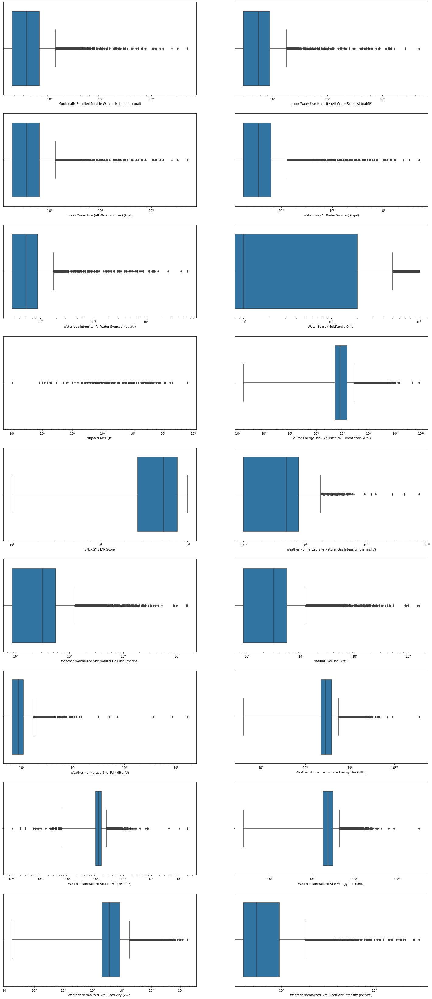

In [63]:
plt.figure(figsize=(25, 100))
for index, column in enumerate(features_to_viz, 1):
    plt.subplot(15, 2, index)
    sns.boxplot(x=df[column])
    plt.xscale('log')
    plt.plot()


### There are outliers in all those features. Hence filling missing values with median as per their corresponding property use type is the most logical way

In [64]:
features_to_viz

['Municipally Supplied Potable Water - Indoor Use (kgal)',
 'Indoor Water Use Intensity (All Water Sources) (gal/ft²)',
 'Indoor Water Use (All Water Sources) (kgal)',
 'Water Use (All Water Sources) (kgal)',
 'Water Use Intensity (All Water Sources) (gal/ft²)',
 'Water Score (Multifamily Only)',
 'Irrigated Area (ft²)',
 'Source Energy Use - Adjusted to Current Year (kBtu)',
 'ENERGY STAR Score',
 'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
 'Weather Normalized Site Natural Gas Use (therms)',
 'Natural Gas Use (kBtu)',
 'Weather Normalized Site EUI (kBtu/ft²)',
 'Weather Normalized Source Energy Use (kBtu)',
 'Weather Normalized Source EUI (kBtu/ft²)',
 'Weather Normalized Site Energy Use (kBtu)',
 'Weather Normalized Site Electricity (kWh)',
 'Weather Normalized Site Electricity Intensity (kWh/ft²)']

In [65]:
# Imputing the numerical features with median values of the corresponding 'Primary Property Type' 

for column in features_to_viz:
    median_values = df.groupby('Primary Property Type - Portfolio Manager-Calculated')[column].median()
    df[column] = df.apply(lambda row: median_values[row['Primary Property Type - Portfolio Manager-Calculated']] if pd.isna(row[column]) else row[column], axis=1)

In [66]:
create_null_df(df)

,Null Count
ENERGY STAR Score,1566
Source Energy Use - Adjusted to Current Year (kBtu),1566
Irrigated Area (ft²),365
Indoor Water Use (All Water Sources) (kgal),183
Indoor Water Use Intensity (All Water Sources) (gal/ft²),183
Municipally Supplied Potable Water - Indoor Use (kgal),183
Water Use (All Water Sources) (kgal),159
Water Use Intensity (All Water Sources) (gal/ft²),159
Weather Normalized Site Natural Gas Intensity (therms/ft²),9
Weather Normalized Site Natural Gas Use (therms),9


### The rest of the null values are due to no corresponding median values available for that specific property type in the original dataset. Hence, the most appropriate way is to fill them is with the median for the specific borough

In [67]:
null_features=create_null_df(df).index.tolist()
null_features

['ENERGY STAR Score',
 'Source Energy Use - Adjusted to Current Year (kBtu)',
 'Irrigated Area (ft²)',
 'Indoor Water Use (All Water Sources) (kgal)',
 'Indoor Water Use Intensity (All Water Sources) (gal/ft²)',
 'Municipally Supplied Potable Water - Indoor Use (kgal)',
 'Water Use (All Water Sources) (kgal)',
 'Water Use Intensity (All Water Sources) (gal/ft²)',
 'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
 'Weather Normalized Site Natural Gas Use (therms)',
 'Natural Gas Use (kBtu)',
 'Weather Normalized Site EUI (kBtu/ft²)',
 'Weather Normalized Site Energy Use (kBtu)',
 'Weather Normalized Source EUI (kBtu/ft²)',
 'Weather Normalized Source Energy Use (kBtu)']

In [68]:
# Filling the remaining null records with the median values of the corresponding 'Borough'

for column in null_features:
    median_values = df.groupby('Borough')[column].median()
    df[column] = df.apply(lambda row: median_values[row['Borough']] if pd.isna(row[column]) else row[column], axis=1)

In [69]:
df.isna().sum()

Property Id                                                                           0
Property Name                                                                         0
Address 1                                                                             0
Postcode                                                                              0
Primary Property Type - Portfolio Manager-Calculated                                  0
Year Built                                                                            0
Number of Buildings                                                                   0
Occupancy                                                                             0
Metered Areas (Energy)                                                                0
Metered Areas  (Water)                                                                0
ENERGY STAR Score                                                                     0
Site EUI (kBtu/ft²)             

### Now, our dataset 1 is completely cleaned, but there are still inconsistencies which we will correct

In [70]:
# In the 'Postcode' feature, we can see that there are some postcodes with length greater than 5 which are invalid. 
# However, the first five numbers of those invalid postcodes are correct.
# Creating a custom function to find postcodes greater than 5

def findInconsistendPostCode(df):
    inconsistent_df=df[df['Postcode'].str.len()>5][['Postcode', 'Borough', 'Property Name']]
    return inconsistent_df

ic_df=findInconsistendPostCode(df)
ic_df

,Postcode,Borough,Property Name
1392,111011128,QUEENS,Krinos Foods LLC
1561,100381836,MANHATTAN,St. Margaret's House
1642,110401433,QUEENS,Parker Jewish Institute For Health Care & Reha...
1675,100224612,MANHATTAN,Hotel Elysee
2135,104537842,BRONX,Davidson
2159,100028021,MANHATTAN,Gouverneur
2243,104542130,BRONX,Thessalonica Court
2884,100168402,MANHATTAN,124 east 28th street - Park South Hotel
2917,112013873,BROOKLYN,1 MTC
3059,112213612,BROOKLYN,Brooklyn Excelsior Charter School


### As we can see, we have inconsistencies in Postcode length where some records have length greater than 5. Hence, we need to correct them

In [71]:
#Correcting ZIP Codes for 'Manhattan' Borough

mask_manhattan=(df['Postcode'].str.len()>5) & (df['Borough']=='MANHATTAN')
mask_manhattan_df=df[mask_manhattan][['Postcode', 'Property Name','NTA', 'Borough']]
mask_manhattan_df['Postcode']=mask_manhattan_df['Postcode'].str[:5]
df.loc[mask_manhattan, 'Postcode']=mask_manhattan_df['Postcode']
df[df['Postcode'].str.len()>5][['Postcode', 'Borough']]

,Postcode,Borough
1392,111011128,QUEENS
1642,110401433,QUEENS
2135,104537842,BRONX
2243,104542130,BRONX
2917,112013873,BROOKLYN
3059,112213612,BROOKLYN
3936,103145307,STATEN IS
4232,112073442,BROOKLYN
4248,104601022,BRONX
4805,104541907,BRONX


In [72]:
#Correcting ZIP Codes for 'Queens' Borough

mask_queens=(df['Postcode'].str.len()>5) & (df['Borough']=='QUEENS')
mask_queens_df=df[mask_queens][['Postcode', 'Property Name','NTA', 'Borough']]
mask_queens_df['Postcode']=mask_queens_df['Postcode'].str[:5]
df.loc[mask_queens, 'Postcode']=mask_queens_df['Postcode']
df[df['Postcode'].str.len()>5][['Postcode', 'Borough']]

,Postcode,Borough
2135,104537842,BRONX
2243,104542130,BRONX
2917,112013873,BROOKLYN
3059,112213612,BROOKLYN
3936,103145307,STATEN IS
4232,112073442,BROOKLYN
4248,104601022,BRONX
4805,104541907,BRONX
5586,112111708,BROOKLYN
5587,112111708,BROOKLYN


In [73]:
#Correcting ZIP Codes for 'Bronx' Borough

mask_bronx=(df['Postcode'].str.len()>5) & (df['Borough']=='BRONX')
mask_bronx_df=df[mask_bronx][['Postcode', 'Property Name','NTA', 'Borough']]
mask_bronx_df['Postcode']=mask_bronx_df['Postcode'].str[:5]
df.loc[mask_bronx, 'Postcode']=mask_bronx_df['Postcode']
df[df['Postcode'].str.len()>5][['Postcode', 'Borough']]

,Postcode,Borough
2917,112013873,BROOKLYN
3059,112213612,BROOKLYN
3936,103145307,STATEN IS
4232,112073442,BROOKLYN
5586,112111708,BROOKLYN
5587,112111708,BROOKLYN
7080,112063812,BROOKLYN
11889,112074037,BROOKLYN
11890,112074037,BROOKLYN


In [74]:
#Correcting ZIP Codes for 'Brooklyn' Borough

mask_brooklyn=(df['Postcode'].str.len()>5) & (df['Borough']=='BROOKLYN')
mask_brooklyn_df=df[mask_brooklyn][['Postcode', 'Property Name','NTA', 'Borough']]
mask_brooklyn_df['Postcode']=mask_brooklyn_df['Postcode'].str[:5]
df.loc[mask_brooklyn, 'Postcode']=mask_brooklyn_df['Postcode']
df[df['Postcode'].str.len()>5][['Postcode', 'Borough']]

,Postcode,Borough
3936,103145307,STATEN IS


In [75]:
#Correcting ZIP Codes for 'Staten Island' Borough

mask_staten=(df['Postcode'].str.len()>5) & (df['Borough']=='STATEN IS')
mask_staten_df=df[mask_staten][['Postcode', 'Property Name','NTA', 'Borough']]
mask_staten_df['Postcode']=mask_staten_df['Postcode'].str[:5]
df.loc[mask_staten, 'Postcode']=mask_staten_df['Postcode']
df[df['Postcode'].str.len()>5][['Postcode', 'Borough']]

,Postcode,Borough


In [76]:
df[df['Postcode'].str.len()>5]

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Indoor Water Use Intensity (All Water Sources) (gal/ft²),Municipally Supplied Potable Water - Indoor Use (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2)


### The inconsistencies in 'Postcode' features has been taken care of.

### Inspecting the 'Year Built' feature

In [77]:
df['Year Built'].describe()

count    23003.000000
mean      1947.451767
std         33.719349
min       1051.000000
25%       1925.000000
50%       1936.000000
75%       1967.000000
max       2020.000000
Name: Year Built, dtype: float64

### Here, we can see that the minimum year is 1051 which does not makes any sense and mostly due to data entry year. 

In [78]:
# Finding 10 earliest years in 'Year Built' feature

df['Year Built'].nsmallest(10)

18453    1051
20440    1393
3003     1600
11122    1649
11190    1800
14838    1801
14738    1811
13364    1815
2236     1827
17999    1832
Name: Year Built, dtype: int64

In [79]:
df.loc[[18453, 20440, 3003, 11122], ['Property Name', 'Address 1', 'Year Built', 'Postcode', 'Borough']]

,Property Name,Address 1,Year Built,Postcode,Borough
18453,Rocklyn: 52-29 83rd St,5217 83 ST,1051,11373,QUEENS
20440,Queens Quality Management - 6541 Booth st,6541 Booth st,1393,11374,QUEENS
3003,JEMB - 150 Broadway,150 Broadway,1600,10038,MANHATTAN
11122,East Island Mgmt,10236 64th Avenue,1649,11375,QUEENS


### The above values for 'Year Built' is not correct. Hence manually correcting them using actual values from internet

In [80]:
df.loc[20440, 'Year Built']=1939

In [81]:
df.loc[[18453, 20440, 3003, 11122], ['Property Name', 'Address 1', 'Year Built', 'Postcode', 'Borough']]

,Property Name,Address 1,Year Built,Postcode,Borough
18453,Rocklyn: 52-29 83rd St,5217 83 ST,1051,11373,QUEENS
20440,Queens Quality Management - 6541 Booth st,6541 Booth st,1939,11374,QUEENS
3003,JEMB - 150 Broadway,150 Broadway,1600,10038,MANHATTAN
11122,East Island Mgmt,10236 64th Avenue,1649,11375,QUEENS


In [82]:
df.loc[3003, 'Year Built']=1924

In [83]:
df.loc[[18453, 20440, 3003, 11122], ['Property Name', 'Address 1', 'Year Built', 'Postcode', 'Borough']]

,Property Name,Address 1,Year Built,Postcode,Borough
18453,Rocklyn: 52-29 83rd St,5217 83 ST,1051,11373,QUEENS
20440,Queens Quality Management - 6541 Booth st,6541 Booth st,1939,11374,QUEENS
3003,JEMB - 150 Broadway,150 Broadway,1924,10038,MANHATTAN
11122,East Island Mgmt,10236 64th Avenue,1649,11375,QUEENS


In [84]:
df.loc[11122, 'Year Built']=1949

In [85]:
df.loc[18453, 'Year Built']=1951

In [86]:
df.loc[[18453, 20440, 3003, 11122], ['Property Name', 'Address 1', 'Year Built', 'Postcode', 'Borough']]

,Property Name,Address 1,Year Built,Postcode,Borough
18453,Rocklyn: 52-29 83rd St,5217 83 ST,1951,11373,QUEENS
20440,Queens Quality Management - 6541 Booth st,6541 Booth st,1939,11374,QUEENS
3003,JEMB - 150 Broadway,150 Broadway,1924,10038,MANHATTAN
11122,East Island Mgmt,10236 64th Avenue,1949,11375,QUEENS


In [87]:
df['Year Built'].describe()

count    23003.000000
mean      1947.541755
std         32.857134
min       1800.000000
25%       1925.000000
50%       1936.000000
75%       1967.000000
max       2020.000000
Name: Year Built, dtype: float64

### Now, every inconsistency in 'Year Built' column has been resolved

In [88]:
# Resetting the index

df.reset_index(drop=True, inplace=True)

### Inspecting duplicate records

In [89]:
df[df.duplicated(subset=['Property Id'], keep=False)]

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Indoor Water Use Intensity (All Water Sources) (gal/ft²),Municipally Supplied Potable Water - Indoor Use (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2)
1266,2290685,Waterman - 125 West 55th Street,125 West 55th Street,10019,Office,1989,1,100,Whole Building,Whole Building,...,29.150,16650.70,29.15,0.0,0.0,MANHATTAN,40.763514,-73.979276,Midtown-Midtown South,571246.0
1267,2290685,Waterman - 125 West 55th Street,125 West 55th Street,10019,Office,1989,1,100,Whole Building,Whole Building,...,29.150,16650.70,29.15,0.0,0.0,MANHATTAN,40.763514,-73.979276,Midtown-Midtown South,571246.0
1432,2558870,GC - 498 7th Ave,498 7th Ave,10018,Office,1920,1,100,Whole Building,Whole Building,...,17.310,16202.10,17.31,0.0,0.0,MANHATTAN,40.752808,-73.989320,Midtown-Midtown South,936037.0
1433,2558870,GC - 498 7th Ave,498 7th Ave,10018,Office,1920,1,100,Whole Building,Whole Building,...,17.310,16202.10,17.31,0.0,0.0,MANHATTAN,40.752808,-73.989320,Midtown-Midtown South,936037.0
1550,2604497,150 Brighton 15th Street,150 Brighton 15 St,11235,Multifamily Housing,1927,1,100,Whole Building,Whole Building,...,65.940,4121.20,65.94,25.0,0.0,BROOKLYN,40.578106,-73.954789,Brighton Beach,62500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22172,6825365,4401 Bronx Boulevard,4401 Bronx Boulevard,10470,Medical Office,1969,1,100,Whole Building,Whole Building,...,33.565,2148.05,30.02,0.0,0.0,BRONX,40.900082,-73.857605,Woodlawn-Wakefield,40000.0
22181,6825492,170 East Mosholu Parkway South,170 East Mosholu Parkway South,10458,Multifamily Housing,2012,1,100,Whole Building,Whole Building,...,62.610,3882.30,62.36,15.0,0.0,BRONX,40.874881,-73.883458,Bedford Park-Fordham North,27173.0
22182,6825492,170 East Mosholu Parkway South,170 East Mosholu Parkway South,10458,Multifamily Housing,2012,1,100,Whole Building,Whole Building,...,60.740,1650.40,60.74,26.0,0.0,BRONX,40.874881,-73.883458,Bedford Park-Fordham North,27173.0
22183,6825495,27 East 169th Street,27 East 169th Street,10452,Multifamily Housing,2012,1,100,Whole Building,Whole Building,...,62.610,3882.30,62.36,15.0,0.0,BRONX,40.837507,-73.918745,West Concourse,32314.0


### The above duplicate entries has to be removed

In [90]:
# Dropping duplicate records

df=df.drop_duplicates(subset=['Property Id'])

In [91]:
df.reset_index(drop=True, inplace=True)

### Our Dataset 1 is completely cleaned

## Let's start cleaning Dataset 2

In [92]:
# Changing the name of the first dataset to df1

df1=df

In [93]:
# Reading the second dataset as df2

df2=pd.read_csv('data/Original Data/Local_Law_84_2019__Monthly_Data_for_Calendar_Year_2018__20231026.csv')

In [94]:
df2

,Property Id,Property Name,Parent Property Id,Parent Property Name,Month,Natural Gas Use (kBtu),Electricity Use (kBtu)
0,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Jan,Not Available,2191816.3
1,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Feb,Not Available,1881934
2,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Mar,Not Available,1960262.3
3,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Apr,Not Available,1842159.3
4,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-May,Not Available,1893434.5
...,...,...,...,...,...,...,...
309523,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Aug,24928.8,62421.7
309524,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Sep,22638.1,47562.1
309525,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Oct,24485.4,35763.5
309526,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,18-Nov,24704.5,39085.3


In [95]:
df2.shape

(309528, 7)

In [96]:
df1.shape

(22793, 51)

### The main difference between df1 and df2 is that df1 contains information of annual consumption (Year 2018) of different properties in NYC whereas df2 consists energy consumption of every property in every calendar month. For instance: If there is a property with Property Id = 1001, then it will consists of 12 records for the given id (from January to December). Hence the size of df2 is very high.

### Changing the format for feature 'Month'

In [97]:
# Changing format of 'Month' feature

df2['Month']=df2['Month'].str.replace('18-', '')
df2['Month']=pd.to_datetime(df2['Month'], format='%b').dt.strftime('%b')

In [98]:
df2

,Property Id,Property Name,Parent Property Id,Parent Property Name,Month,Natural Gas Use (kBtu),Electricity Use (kBtu)
0,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Jan,Not Available,2191816.3
1,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Feb,Not Available,1881934
2,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Mar,Not Available,1960262.3
3,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Apr,Not Available,1842159.3
4,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,May,Not Available,1893434.5
...,...,...,...,...,...,...,...
309523,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Aug,24928.8,62421.7
309524,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Sep,22638.1,47562.1
309525,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Oct,24485.4,35763.5
309526,9643128,3650 Bronx Boulevard,Not Applicable: Standalone Property,Not Applicable: Standalone Property,Nov,24704.5,39085.3


### The features 'Parent Property Id' and 'Parent Property Name' irrelevant for our analysis. Hence we will drop them

In [99]:
# Dropping 'Parent Property Id' and 'Parent Property Name'

irr_features=[
    'Parent Property Id',
    'Parent Property Name'
]
df2.drop(columns=irr_features, inplace=True)

In [100]:
df2.shape

(309528, 5)

In [101]:
df2.head(10)

,Property Id,Property Name,Month,Natural Gas Use (kBtu),Electricity Use (kBtu)
0,7365,1155,Jan,Not Available,2191816.3
1,7365,1155,Feb,Not Available,1881934
2,7365,1155,Mar,Not Available,1960262.3
3,7365,1155,Apr,Not Available,1842159.3
4,7365,1155,May,Not Available,1893434.5
5,7365,1155,Jun,Not Available,1928829.3
6,7365,1155,Jul,Not Available,2168239.6
7,7365,1155,Aug,Not Available,2198702
8,7365,1155,Sep,Not Available,2025748.4
9,7365,1155,Oct,Not Available,2000925.1


### Converting the "Not Available" values into NaN values

In [102]:
# In this dataframe also, we have null values as "Not Available".
# Hence, we have replace it NaN

df2.replace("Not Available", np.nan, inplace=True)

In [103]:
df2.isna().sum()

Property Id                    0
Property Name                  0
Month                          0
Natural Gas Use  (kBtu)    39099
Electricity Use  (kBtu)     7530
dtype: int64

### Since we are interested in finding summer usage, we will find average summer energy consumption for the properties (Usage for months June, July and August)

In [104]:
# Filtering records for summer months i.e. June, July and August+

df2=df2[df2['Month'].isin(['Jun', 'Jul', 'Aug'])]

In [105]:
df2.shape

(77382, 5)

In [106]:
df2.isna().sum()

Property Id                    0
Property Name                  0
Month                          0
Natural Gas Use  (kBtu)    11278
Electricity Use  (kBtu)     1890
dtype: int64

In [107]:
# Finding number of unique properties in both dataframes

print("Unique Property Ids in df1:",df1['Property Id'].nunique())
print("Unique Property Ids in df2:",df2['Property Id'].nunique())

Unique Property Ids in df1: 22793
Unique Property Ids in df2: 25794


### As we can see above, there are more unique properties in df2 than df1 which we will handle later

In [108]:
df2.reset_index(drop=True, inplace=True)

### Changing dtypes of 'Natural Gas Use  (kBtu)' and 'Electricity Use  (kBtu)' into numeric

In [109]:
# Changing the datatypes of 'Natural Gas Use  (kBtu)' and 'Electricity Use  (kBtu)' from object to numeric

import warnings
warnings.filterwarnings('ignore')
df2['Natural Gas Use  (kBtu)']=df2['Natural Gas Use  (kBtu)'].astype('float64')
df2['Electricity Use  (kBtu)']=df2['Electricity Use  (kBtu)'].astype('float64')

### Taking average of summer usage for each properties in df2 and creating new columns 'Average Summer Gas Usage' and 'Average Summer Electricity Usage'

In [110]:
df2.head()

,Property Id,Property Name,Month,Natural Gas Use (kBtu),Electricity Use (kBtu)
0,7365,1155,Jun,NaN,1928829.3
1,7365,1155,Jul,NaN,2168239.6
2,7365,1155,Aug,NaN,2198702.0
3,8139,200,Jun,NaN,1518119.3
4,8139,200,Jul,NaN,1601837.8


In [111]:
df2.columns

Index(['Property Id', 'Property Name', 'Month', 'Natural Gas Use  (kBtu)',
       'Electricity Use  (kBtu)'],
      dtype='object')

In [112]:
# Creating a custom function which will calculate mean of features

def custom_mean(series):
    return series.mean() if not series.isnull().any() else np.nan

In [113]:
# Grouping each property by 'Property Id' and applying mean for all numeric features and creating
# a new dataframe named 'summer_mean_df'

summer_mean_df=df2.groupby('Property Id').agg({'Natural Gas Use  (kBtu)': custom_mean, 
                                               'Electricity Use  (kBtu)': custom_mean}).reset_index()
summer_mean_df

,Property Id,Natural Gas Use (kBtu),Electricity Use (kBtu)
0,7365,NaN,2.098590e+06
1,8139,NaN,1.651919e+06
2,8604,72522.200000,2.516934e+06
3,8841,NaN,1.495032e+06
4,11809,420374.000000,9.892624e+06
...,...,...,...
25789,9642206,NaN,3.705807e+04
25790,9642529,2566.666667,9.617290e+04
25791,9642561,NaN,NaN
25792,9642581,94494.766667,1.832687e+05


In [114]:
summer_mean_df.columns=['Property Id', 'Average Summer Gas Usage (kBtu)', 'Average Summer Electricity Usage (kBtu)']

In [115]:
summer_mean_df

,Property Id,Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu)
0,7365,NaN,2.098590e+06
1,8139,NaN,1.651919e+06
2,8604,72522.200000,2.516934e+06
3,8841,NaN,1.495032e+06
4,11809,420374.000000,9.892624e+06
...,...,...,...
25789,9642206,NaN,3.705807e+04
25790,9642529,2566.666667,9.617290e+04
25791,9642561,NaN,NaN
25792,9642581,94494.766667,1.832687e+05


### Merging summer_mean_df with the df2

In [116]:
# Merging the new summer_mean_df with df2

df2=df2.merge(summer_mean_df, on='Property Id', how='left')
df2.head()

,Property Id,Property Name,Month,Natural Gas Use (kBtu),Electricity Use (kBtu),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu)
0,7365,1155,Jun,NaN,1928829.3,NaN,2098590.3
1,7365,1155,Jul,NaN,2168239.6,NaN,2098590.3
2,7365,1155,Aug,NaN,2198702.0,NaN,2098590.3
3,8139,200,Jun,NaN,1518119.3,NaN,1651918.7
4,8139,200,Jul,NaN,1601837.8,NaN,1651918.7


### Now our 'Month', 'Property Name', 'Natural Gas Use (kBtu)' and '	Electricity Use (kBtu)' is redundant. Hence we will drop them. Also now one property id has two duplicate values in addition to itself. So, we will need to drop those duplicate values

In [117]:
# Dropping the columns

df2.drop(columns=['Month', 'Property Name', 'Natural Gas Use  (kBtu)', 'Electricity Use  (kBtu)'], inplace=True)

In [118]:
df2.head()

,Property Id,Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu)
0,7365,NaN,2098590.3
1,7365,NaN,2098590.3
2,7365,NaN,2098590.3
3,8139,NaN,1651918.7
4,8139,NaN,1651918.7


In [119]:
# Dropping duplicate records in "Property Id"

df2.drop_duplicates(subset=['Property Id'], inplace=True)

In [120]:
# Resetting index

df2.reset_index(drop=True, inplace=True)

### Now there are 'Property Id' common column in both df1 and df2. Hence we will merge them into one single dataframe

### Merging df2 with df1

In [121]:
# Merging df1 with df2 on 'Property Id' with left join so that df1 data is preserved
 
df=df1.merge(df2, on='Property Id', how='left')

In [122]:
df

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu)
0,7365,1155,1155 Avenue of the Americas,10036,Office,1982,1,40,Whole Building,Whole Building,...,17.38,0.0,0.0,MANHATTAN,40.756631,-73.982826,Midtown-Midtown South,685705.9,NaN,2.098590e+06
1,8139,200,200 East 42nd St.,10017,Office,1956,1,100,Whole Building,Whole Building,...,18.87,0.0,0.0,MANHATTAN,40.750698,-73.974306,Turtle Bay-East Midtown,384432.0,NaN,1.651919e+06
2,8604,114,114 West 47th st,10036,Financial Office,1989,1,95,Whole Building,Whole Building,...,22.27,0.0,0.0,MANHATTAN,40.758310,-73.982504,Midtown-Midtown South,577534.0,72522.200000,2.516934e+06
3,8841,733,733 Third Avenue,10017,Office,1961,1,100,Whole Building,Whole Building,...,17.38,0.0,0.0,MANHATTAN,40.753074,-73.972753,Turtle Bay-East Midtown,393087.2,NaN,1.495032e+06
4,11809,Conde Nast Building,4 Times Square,10036,Office,1999,1,100,Whole Building,Whole Building,...,17.38,0.0,0.0,MANHATTAN,40.756181,-73.986244,Midtown-Midtown South,1601977.0,420374.000000,9.892624e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22788,7538500,100 Belmont Place,100 Belmont Place,10301,Multifamily Housing,1966,2,100,"Common Area Cooling, Tenant Hot Water, Common ...",Whole Building,...,62.36,15.0,0.0,STATEN IS,40.642636,-74.079663,West New Brighton-New Brighton-St. George,62160.0,50400.000000,1.349870e+05
22789,7538585,175 WEST 137 STREET,175 WEST 137 STREET,10030,Office,1931,1,100,Whole Building,Whole Building,...,50.04,0.0,0.0,MANHATTAN,40.816205,-73.941795,Central Harlem North-Polo Grounds,26250.0,NaN,9.689617e+04
22790,7538695,91 Davis Avenue and 102 Bard Avenue,91 Davis Avenue,10310,Multifamily Housing,1961,6,100,Whole Building,Whole Building,...,55.01,56.0,0.0,STATEN IS,40.642078,-74.110312,West New Brighton-New Brighton-St. George,52820.0,95766.666667,8.767820e+04
22791,7538696,Polyclinic,335 W 50 ST,10019,Multifamily Housing,1965,1,95,Whole Building,Whole Building,...,70.30,19.0,0.0,MANHATTAN,40.762996,-73.987766,Clinton,150000.0,96066.333333,5.532720e+05


### Inspecting outlier distribution for 'Average Summer Gas Usage (kBtu)' and 'Average Summer Electricity Usage (kBtu)'

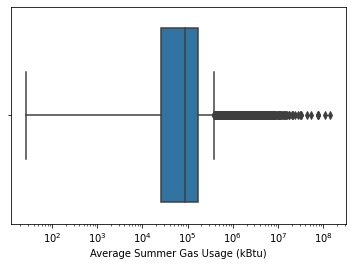

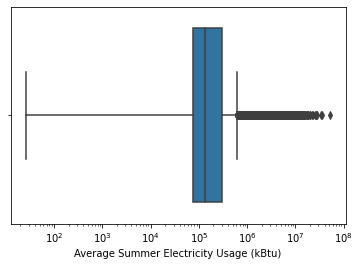

In [123]:
cols_to_viz=['Average Summer Gas Usage (kBtu)', 'Average Summer Electricity Usage (kBtu)']
for col in cols_to_viz:
    sns.boxplot(x=df[col].dropna(), data=df)
    plt.xscale('log')
    plt.show()

### As we can see, we have outliers and thus, missing values should be filled with median values for the corresponding property type

In [124]:
df['Primary Property Type - Portfolio Manager-Calculated']

0                     Office
1                     Office
2           Financial Office
3                     Office
4                     Office
                ...         
22788    Multifamily Housing
22789                 Office
22790    Multifamily Housing
22791    Multifamily Housing
22792                  Other
Name: Primary Property Type - Portfolio Manager-Calculated, Length: 22793, dtype: object

In [125]:

# df.groupby('Primary Property Type - Portfolio Manager-Calculated')[['Average Summer Gas Usage (kBtu)', 'Average Summer Electricity Usage (kBtu)']].median()

In [126]:
# Calculating median for numeric features of summer dataframe as per their corresponding property type

df['Average Summer Gas Usage (kBtu)'] =df.groupby('Primary Property Type - Portfolio Manager-Calculated')['Average Summer Gas Usage (kBtu)'].transform(lambda x: x.fillna(x.median()))
df['Average Summer Electricity Usage (kBtu)'] =df.groupby('Primary Property Type - Portfolio Manager-Calculated')['Average Summer Electricity Usage (kBtu)'].transform(lambda x: x.fillna(x.median()))

In [127]:
# Inspecting still remaining null values

create_null_df(df)

,Null Count
Average Summer Gas Usage (kBtu),14


### Some null values cannot be filled because there is no corresponding entry of 'Average Summer Gas Usage (kBtu)' for the given property type. Hence we have dropped them

In [128]:
# Dropping the remaining null records

df.dropna(subset=['Average Summer Gas Usage (kBtu)'],  inplace=True)
df.reset_index(drop=True, inplace=True)

### Both datasets are now merged and now it contains annual consumption along with summer specific consumption. 

### Analyzing the third dataset. The third dataset contains information about daytime summer surface temperatures for a given locality/neighborhood

In [129]:
# Reading third dataset

df3=pd.read_csv("data/Original Data/NYC EH Data Portal - Daytime summer surface temperature (full table).csv")

In [130]:
df3.head()

,Time,GeoType,GeoID,GeoRank,Geography,Degrees Fahrenheit
0,2018,NTA2010,501,8,Claremont-Bathgate,100.0
1,2018,NTA2010,503,8,Eastchester-Edenwald-Baychester,99.8
2,2018,NTA2010,505,8,Bedford Park-Fordham North,97.4
3,2018,NTA2010,506,8,Belmont,98.7
4,2018,NTA2010,507,8,Bronxdale,98.4


In [131]:
df3['Geography'].nunique()

289

In [132]:
df['NTA'].nunique()

194

### As we can see that in our original dataset (which we had merged earlier) contains 194 unique NTA whereas df3 contains 289 unique localities.

In [133]:
df3.shape

(295, 6)

### The 'Geography' feature in df3 also contains values of the five boroughs along with the entire city. Since, we are doing neighborhood based analysis, we had dropped the records of five boroughs and the city itself

In [134]:
# Dropping records of 5 boroughs and New York City

inconsistent_values=['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'New York City']
for value in inconsistent_values:
    df3.drop(df3[df3['Geography']==value].index, inplace=True)

In [135]:
df3.shape

(289, 6)

In [136]:
# Finding unique 'GeoType' values

df3['GeoType'].unique()

array(['NTA2010', 'CD', 'UHF42'], dtype=object)

### In our df, we have an NTA (Neighborhood Tabulation Areas). Hence we can filter out NTA values from the third dataset (NTA2010) and merge them with the original dataframe

In [137]:
df3=df3[df3['GeoType']=='NTA2010']

### Now, the features 'Time', 'GeoType', 'GeoID' and 'GeoRank' are irrelevant. Hence we will drop them

In [138]:
# Dropping irrelevant features

cols_to_drop=['Time', 'GeoType', 'GeoID', 'GeoRank']
df3.drop(columns=cols_to_drop, inplace=True)

In [139]:
df3

,Geography,Degrees Fahrenheit
0,Claremont-Bathgate,100.0
1,Eastchester-Edenwald-Baychester,99.8
2,Bedford Park-Fordham North,97.4
3,Belmont,98.7
4,Bronxdale,98.4
...,...,...
183,Old Town-Dongan Hills-South Beach,97.1
184,Stapleton-Rosebank,96.4
185,New Dorp-Midland Beach,99.1
186,Arden Heights,97.7


In [140]:
df['NTA'].nunique()

194

In [141]:
df3.columns=['NTA', 'Average Summer Land Surface Temp (F)']

In [142]:
df3

,NTA,Average Summer Land Surface Temp (F)
0,Claremont-Bathgate,100.0
1,Eastchester-Edenwald-Baychester,99.8
2,Bedford Park-Fordham North,97.4
3,Belmont,98.7
4,Bronxdale,98.4
...,...,...
183,Old Town-Dongan Hills-South Beach,97.1
184,Stapleton-Rosebank,96.4
185,New Dorp-Midland Beach,99.1
186,Arden Heights,97.7


In [143]:
df.shape

(22779, 53)

In [144]:
df3.shape

(188, 2)

In [145]:
# Merging df3 with df on 'NTA' with inner join

df=df.merge(df3, on='NTA', how='inner')

In [146]:
df.shape

(22704, 54)

In [147]:
df

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
0,7365,1155,1155 Avenue of the Americas,10036,Office,1982,1,40,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.756631,-73.982826,Midtown-Midtown South,685705.9,3.826703e+04,2.098590e+06,97.5
1,8604,114,114 West 47th st,10036,Financial Office,1989,1,95,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.758310,-73.982504,Midtown-Midtown South,577534.0,7.252220e+04,2.516934e+06,97.5
2,11809,Conde Nast Building,4 Times Square,10036,Office,1999,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.756181,-73.986244,Midtown-Midtown South,1601977.0,4.203740e+05,9.892624e+06,97.5
3,1045358,320 Park Avenue,320 Park Avenue,10022,Financial Office,1994,1,95,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.757450,-73.973798,Midtown-Midtown South,721979.0,1.098052e+05,4.541031e+06,97.5
4,1151970,1133,1133 Avenue of the Americas,10036,Office,1968,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.755942,-73.983324,Midtown-Midtown South,1001539.0,3.826703e+04,4.975748e+06,97.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22699,7386500,91-16 Shore Front Parkway,9116 SHORE FRONT PKWY,11693,Multifamily Housing,2005,1,100,Whole Building,Whole Building,...,15.0,0.0,QUEENS,40.584402,-73.813196,Hammels-Arverne-Edgemere,51940.0,1.223433e+04,1.521775e+05,93.7
22700,2774477,ConEd East 16th Street-750 E16,750 East 16th Street,10009,Office,1970,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.729250,-73.973506,Stuyvesant Town-Cooper Village,119433.0,2.786667e+03,1.528045e+05,94.1
22701,4157734,Peter Cooper Village,360 First Avenue,10010,Multifamily Housing,1947,21,100,Whole Building,Whole Building,...,15.0,0.0,MANHATTAN,40.735712,-73.979223,Stuyvesant Town-Cooper Village,3122165.0,6.045634e+05,5.966441e+06,94.1
22702,4157757,Stuyvesant Town,252 First Ave,10009,Multifamily Housing,1947,35,100,Whole Building,Whole Building,...,40.0,0.0,MANHATTAN,40.731903,-73.982013,Stuyvesant Town-Cooper Village,8942176.0,1.957044e+06,1.785970e+07,94.1


### The above is our combined dataset which contains information about annual energy consumption, summer energy consumption as well as land surface temperature during summer for each property

In [148]:
df['NTA'].value_counts()

Midtown-Midtown South                         1016
Hudson Yards-Chelsea-Flatiron-Union Square     711
Upper West Side                                688
Upper East Side-Carnegie Hill                  599
SoHo-TriBeCa-Civic Center-Little Italy         558
                                              ... 
Laurelton                                        6
Queensboro Hill                                  5
Rossville-Woodrow                                5
Stuyvesant Town-Cooper Village                   4
Arden Heights                                    2
Name: NTA, Length: 188, dtype: int64

In [149]:
df.shape

(22704, 54)

In [150]:
df.isna().sum()

Property Id                                                                           0
Property Name                                                                         0
Address 1                                                                             0
Postcode                                                                              0
Primary Property Type - Portfolio Manager-Calculated                                  0
Year Built                                                                            0
Number of Buildings                                                                   0
Occupancy                                                                             0
Metered Areas (Energy)                                                                0
Metered Areas  (Water)                                                                0
ENERGY STAR Score                                                                     0
Site EUI (kBtu/ft²)             

In [151]:
df.columns

Index(['Property Id', 'Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated', 'Year Built',
       'Number of Buildings', 'Occupancy', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'ENERGY STAR Score', 'Site EUI (kBtu/ft²)',
       'Weather Normalized Site EUI (kBtu/ft²)',
       'National Median Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI', 'Site Energy Use (kBtu)',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Source EUI (kBtu/ft²)', 'Weather Normalized Source EUI (kBtu/ft²)',
       'National Median Source EUI (kBtu/ft²)',
       '% Difference from National Median Source EUI',
       'Source Energy Use - Adjusted to Current Year (kBtu)',
       'Source Energy Use (kBtu)',
       'Weather Normalized Source Energy Use (kBtu)', 'Natural Gas Use (kBtu

### We are focusing on weather normalized site indicators. Hence we will remove all other plain source, site and source normalized site indicators. Also some indicators like 'National Median Site EUI' are redundant as we have a column of '% difference from National Median Site EUI'. Thus they are also removed.

In [152]:
# Dropping redundant columns

red_cols=['Site EUI (kBtu/ft²)', 'National Median Site EUI (kBtu/ft²)', 'Site Energy Use (kBtu)', 'Source EUI (kBtu/ft²)', 
          'Weather Normalized Source EUI (kBtu/ft²)', 'National Median Source EUI (kBtu/ft²)',
          '% Difference from National Median Source EUI', 'Source Energy Use - Adjusted to Current Year (kBtu)',
          'Source Energy Use (kBtu)', 'Weather Normalized Source Energy Use (kBtu)', 'Natural Gas Use (kBtu)',
          'Electricity Use - Grid Purchase (kBtu)', 'Electricity Use - Grid Purchase (kWh)', 'Property GFA - Self-Reported (ft²)',
          'Property GFA - Self-Reported (ft²)', 'Indoor Water Use (All Water Sources) (kgal)', 'Indoor Water Use Intensity (All Water Sources) (gal/ft²)',
          'Municipally Supplied Potable Water - Indoor Use (kgal)',
         ]
df.drop(columns=red_cols, inplace=True)

In [153]:
df.columns

Index(['Property Id', 'Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated', 'Year Built',
       'Number of Buildings', 'Occupancy', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Weather Normalized Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissio

In [154]:
# Selecting numeric columns

numeric_cols=df.select_dtypes(include=['int','float']).drop(columns=['Property Id', 'Year Built', 'Latitude', 'Longitude']).columns
numeric_cols

Index(['Number of Buildings', 'Occupancy', 'ENERGY STAR Score',
       'Weather Normalized Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissions (Metric Tons CO2e)',
       'Percent of Electricity that is Green Power',
       'Water Use (All Water Sources) (kgal)',
       'Water Use Intensity (All Water Sources) (gal/ft²)',
       'Water Sc

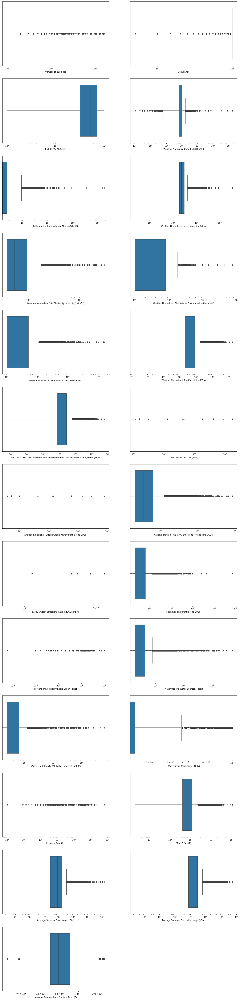

In [155]:
# Plotting a boxplot to inspect the distribution of numerical features

plt.figure(figsize=(20, 100))
for index, column in enumerate(numeric_cols, 1):
    plt.subplot(15, 2, index)
    sns.boxplot(x=df[column])
    plt.xscale('log')
    plt.plot()

In [156]:
df['Primary Property Type - Portfolio Manager-Calculated'].nunique()

64

### There are total 64 unique property types in our dataframe

In [157]:
# df['% Difference from National Median Site EUI', 'Weather Normalized Site Energy Use (kBtu)','Net Emissions (Metric Tons CO2e)']

In [158]:
# Some columns as mentioned below have some unusual value. Hence, we will inspect them

cols_of_interest=['% Difference from National Median Site EUI', 
                  'Weather Normalized Site Energy Use (kBtu)',
                  'Net Emissions (Metric Tons CO2e)']

### From visual inspection, it was found that some columns (cols_of_interest) had abnormally high values. We will find the outliers using zscore method and investigate it

In [159]:
from scipy.stats import zscore

z_scores=df[cols_of_interest].apply(zscore)
outliers=(z_scores.abs()>3)
# outlier_df=df[outliers.any(axis=1)][cols_of_interest].reset_index(drop=True)

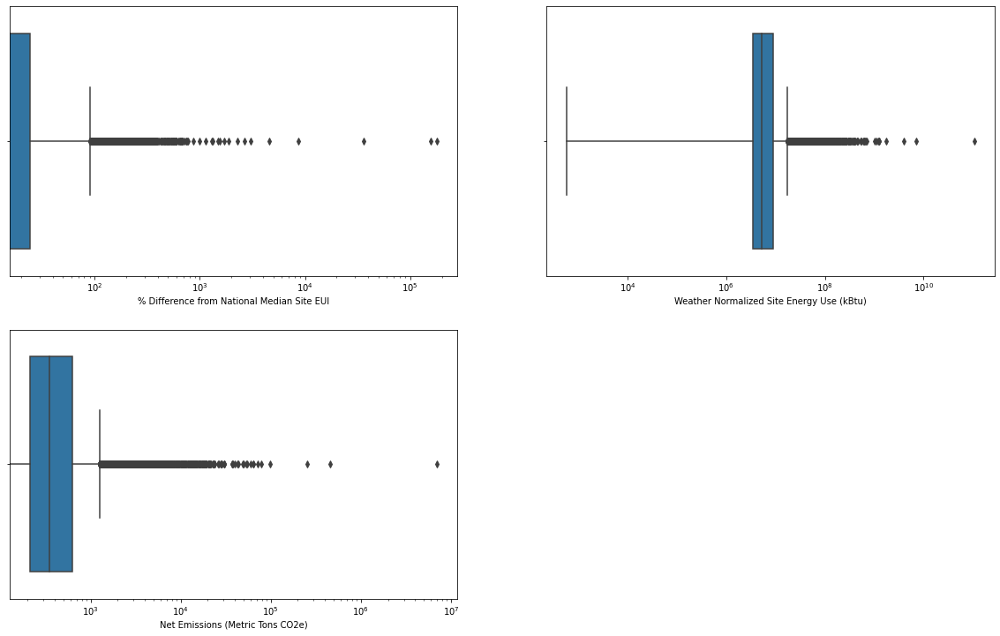

In [160]:
plt.figure(figsize=(20, 100))
for index, column in enumerate(cols_of_interest, 1):
    plt.subplot(15, 2, index)
    sns.boxplot(x=df[column])
    plt.xscale('log')
    plt.plot()

### Here, in all the columns of interest, we have one record which has abnormal values.

In [161]:
# Finding that abnormal record

threshold_pct_diff_median_site=2000
threshold_site_energy_use=10**10
threshold_net_emissions=10**6
df[(df['% Difference from National Median Site EUI']>threshold_pct_diff_median_site) &
  (df['Weather Normalized Site Energy Use (kBtu)']>threshold_site_energy_use) &
  (df['Net Emissions (Metric Tons CO2e)']>threshold_net_emissions)][['Property Name', 'Primary Property Type - Portfolio Manager-Calculated', 'NTA',
                                                                     '% Difference from National Median Site EUI', 'Weather Normalized Site Energy Use (kBtu)',
                                                                     'Net Emissions (Metric Tons CO2e)']]

,Property Name,Primary Property Type - Portfolio Manager-Calculated,NTA,% Difference from National Median Site EUI,Weather Normalized Site Energy Use (kBtu),Net Emissions (Metric Tons CO2e)
708,Museum of Modern Art,Museum,Midtown-Midtown South,178876.4,1.060000e+11,6965938.7


### The property named 'Museum of Modern Art' has abnormal high values for all our columns of interest and we should replace it with median values

In [162]:
median_values=df.groupby('Primary Property Type - Portfolio Manager-Calculated')[cols_of_interest].median()
median_values

,% Difference from National Median Site EUI,Weather Normalized Site Energy Use (kBtu),Net Emissions (Metric Tons CO2e)
Primary Property Type - Portfolio Manager-Calculated,,,
Adult Education,86.10,5.953649e+06,405.75
Ambulatory Surgical Center,291.80,9.487284e+07,6912.00
Automobile Dealership,9.20,4.200005e+06,282.95
Bank Branch,5.35,2.635309e+06,200.05
Bowling Alley,41.90,2.305465e+06,168.10
...,...,...,...
Vocational School,58.10,4.924515e+06,354.00
Wastewater Treatment Plant,3.90,1.721251e+08,13108.40
Wholesale Club/Supercenter,0.60,1.649800e+07,1230.20


In [163]:
# Changing data of index number 708 with a reasonable median value for 'Museum'

for col in cols_of_interest:
    df.loc[708, col]=median_values.loc['Museum', col]

In [164]:
df.loc[708, ['Property Name', 'Primary Property Type - Portfolio Manager-Calculated']+cols_of_interest]

Property Name                                           Museum of Modern Art
Primary Property Type - Portfolio Manager-Calculated                  Museum
% Difference from National Median Site EUI                             151.2
Weather Normalized Site Energy Use (kBtu)                         11465185.4
Net Emissions (Metric Tons CO2e)                                       742.3
Name: 708, dtype: object

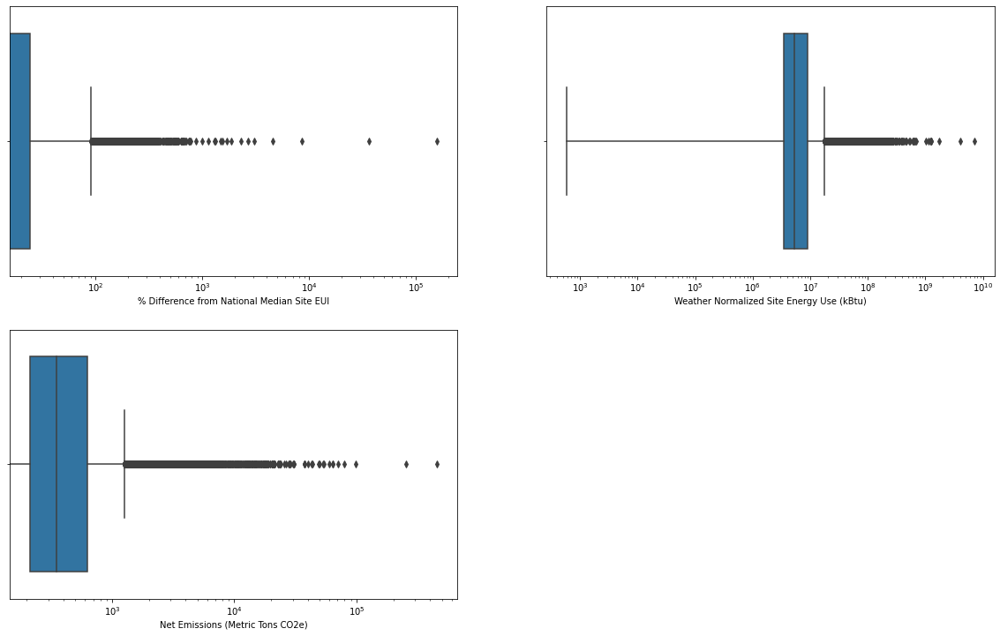

In [165]:
# Once again creating a boxplot to double check that we have handled the outlier

plt.figure(figsize=(20, 100))
for index, column in enumerate(cols_of_interest, 1):
    plt.subplot(15, 2, index)
    sns.boxplot(x=df[column])
    plt.xscale('log')
    plt.plot()

### Rest of the outliers are genuine values

In [166]:
df.columns

Index(['Property Id', 'Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated', 'Year Built',
       'Number of Buildings', 'Occupancy', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Weather Normalized Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissio

In [167]:
df.reset_index(drop=True, inplace=True)

### Thus our entire dataframe is cleaned and we can move on with next stage i.e. 'Exploratory Data Analysis' (EDA)

## Exploratory Data Analysis (EDA)

### EDA is an important stage in data science project. Here we inspect the patterns, find insights and answer questions by creating tables and visualizations.

Potential Questions:
1) Which 10 areas/zones in NYC have higher energy usage and surface temperatures?  
2) Which type of buildings consume the most energy?  
3) What is the water usage of different properties?  
4) What are GHG emissions as per building type?    
5) How are the buildings in NYC performing as compared to national median?  
6) What is the distribution of building age in NYC?  
7) What is the geographic distribution of energy usage, natural gas and electricity consumption


In [168]:
df.shape

(22704, 37)

In [169]:
df.describe()

,Property Id,Year Built,Number of Buildings,Occupancy,ENERGY STAR Score,Weather Normalized Site EUI (kBtu/ft²),% Difference from National Median Site EUI,Weather Normalized Site Energy Use (kBtu),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),...,Water Use (All Water Sources) (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Latitude,Longitude,Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
count,2.270400e+04,22704.000000,22704.000000,22704.000000,22704.000000,22704.000000,22704.000000,2.270400e+04,22704.000000,22704.000000,...,2.270400e+04,22704.000000,22704.000000,22704.000000,22704.000000,22704.000000,2.270400e+04,2.270400e+04,2.270400e+04,22704.000000
mean,4.941560e+06,1947.580162,1.230444,98.453797,51.933470,103.028790,19.486104,1.137233e+07,7.949908,0.519457,...,6.107874e+03,78.366633,15.554968,196.252678,40.749780,-73.937168,1.207966e+05,2.195682e+05,3.925709e+05,97.915200
std,1.765032e+06,32.871688,3.436631,8.169583,27.761586,1272.229811,1071.194250,6.259150e+07,8.207390,0.732633,...,5.518216e+04,648.823980,22.146654,5408.137853,0.078105,0.063100,2.292808e+05,1.791957e+06,1.164817e+06,1.809809
min,7.365000e+03,1800.000000,0.000000,0.000000,1.000000,0.000000,-100.000000,5.938000e+02,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000,40.509037,-74.244118,2.000000e+02,2.650000e+01,2.600000e+01,92.600000
25%,3.089740e+06,1925.000000,1.000000,100.000000,32.000000,65.700000,-20.400000,3.418049e+06,3.900000,0.100000,...,1.925700e+03,24.050000,0.000000,0.000000,40.702363,-73.979715,4.049475e+04,2.634249e+04,7.677285e+04,97.000000
50%,5.836408e+06,1936.000000,1.000000,100.000000,52.000000,86.200000,-0.600000,5.268282e+06,5.400000,0.500000,...,3.896100e+03,62.360000,15.000000,0.000000,40.751634,-73.949424,6.452950e+04,8.398655e+04,1.317811e+05,97.900000
75%,6.580738e+06,1967.000000,1.000000,100.000000,72.000000,105.600000,24.300000,9.084855e+06,9.500000,0.800000,...,4.285600e+03,62.720000,15.000000,0.000000,40.813662,-73.903250,1.151625e+05,1.543493e+05,2.954596e+05,99.100000
max,7.538772e+06,2020.000000,161.000000,100.000000,100.000000,167844.300000,156652.200000,7.033559e+09,301.800000,73.200000,...,5.135098e+06,61166.030000,100.000000,640000.000000,40.912869,-73.700935,1.047757e+07,1.422811e+08,5.270423e+07,102.800000


In [170]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22704 entries, 0 to 22703
Data columns (total 37 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   Property Id                                                                         22704 non-null  int64  
 1   Property Name                                                                       22704 non-null  object 
 2   Address 1                                                                           22704 non-null  object 
 3   Postcode                                                                            22704 non-null  object 
 4   Primary Property Type - Portfolio Manager-Calculated                                22704 non-null  object 
 5   Year Built                                                                          22704 non-n

In [171]:
df.dtypes.value_counts(normalize=True)

float64    0.675676
object     0.216216
int64      0.108108
dtype: float64

In [172]:
df.columns

Index(['Property Id', 'Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated', 'Year Built',
       'Number of Buildings', 'Occupancy', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Weather Normalized Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissio

In [173]:
# Ques: Which 10 areas/zones in NYC have higher energy usage and surface temperatures?

locations_by_energy_use_df=df.groupby('NTA')[['Weather Normalized Site Energy Use (kBtu)']].median().reset_index().sort_values(by=[
    'Weather Normalized Site Energy Use (kBtu)'], ascending=False)[:10].reset_index(drop=True)
locations_by_energy_use_df

,NTA,Weather Normalized Site Energy Use (kBtu)
0,Stuyvesant Town-Cooper Village,95157820.80
1,Battery Park City-Lower Manhattan,19816241.40
2,Glen Oaks-Floral Park-New Hyde Park,16027817.50
3,Parkchester,13118957.50
4,Ft. Totten-Bay Terrace-Clearview,12698190.65
5,Turtle Bay-East Midtown,12360185.30
6,Arden Heights,11002688.90
7,Lincoln Square,10562631.65
8,Bellerose,10487255.70
9,Lenox Hill-Roosevelt Island,10045235.00


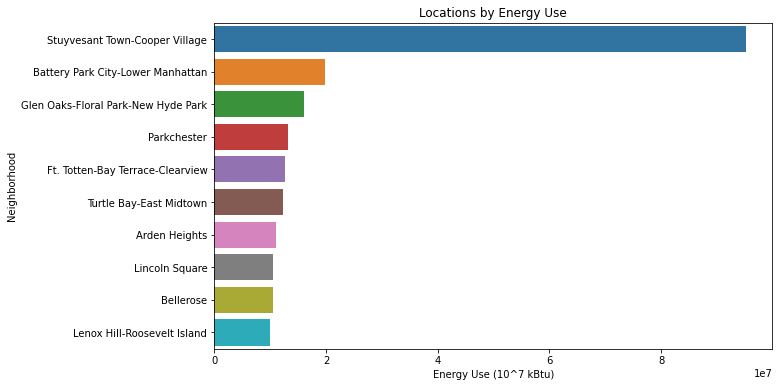

In [174]:
plt.rcParams['figure.figsize']=(10, 6)
sns.barplot(x=locations_by_energy_use_df['Weather Normalized Site Energy Use (kBtu)'],
           y=locations_by_energy_use_df['NTA'])
plt.title('Locations by Energy Use')
plt.xlabel('Energy Use (10^7 kBtu)')
plt.ylabel('Neighborhood')
plt.show()

### In the above barplot, we can see that areas of Manhattan have higher energy usage

In [175]:
# Ques: Which 10 areas/zones in NYC have higher energy usage and surface temperatures?

locations_by_surface_temps_df=df.groupby('NTA')[['Average Summer Land Surface Temp (F)', 'Borough']].agg({
    'Average Summer Land Surface Temp (F)': 'median',
    'Borough': 'first'
}).reset_index().sort_values(by=['Average Summer Land Surface Temp (F)'], ascending=False)[:10].reset_index(drop=True)
locations_by_surface_temps_df

,NTA,Average Summer Land Surface Temp (F),Borough
0,South Jamaica,102.8,QUEENS
1,Queens Village,102.7,QUEENS
2,Jamaica,102.6,QUEENS
3,South Ozone Park,102.4,QUEENS
4,Cambria Heights,102.4,QUEENS
5,Hollis,102.4,QUEENS
6,St. Albans,102.3,QUEENS
7,Richmond Hill,102.3,QUEENS
8,Laurelton,102.1,QUEENS
9,Baisley Park,101.7,QUEENS


### The neighborhood of Queens dominated with higher land surface temperatures during summer

In [176]:
energy_use_by_borough=df.groupby('NTA')[['Borough','Weather Normalized Site Energy Use (kBtu)']].agg({
    'Borough':'first',
    'Weather Normalized Site Energy Use (kBtu)': 'median'
})[:10].reset_index().sort_values(by=[
    'Weather Normalized Site Energy Use (kBtu)'
], ascending=False).reset_index(drop=True)
energy_use_by_borough

,NTA,Borough,Weather Normalized Site Energy Use (kBtu)
0,Battery Park City-Lower Manhattan,MANHATTAN,19816241.4
1,Arden Heights,STATEN IS,11002688.9
2,Allerton-Pelham Gardens,BRONX,6897193.7
3,Baisley Park,QUEENS,6541814.8
4,Annadale-Huguenot-Prince's Bay-Eltingville,STATEN IS,5833667.5
5,Astoria,QUEENS,4654782.0
6,Bay Ridge,BROOKLYN,4644583.4
7,Bayside-Bayside Hills,QUEENS,4420650.0
8,Bath Beach,BROOKLYN,4414226.2
9,Auburndale,QUEENS,3345774.6


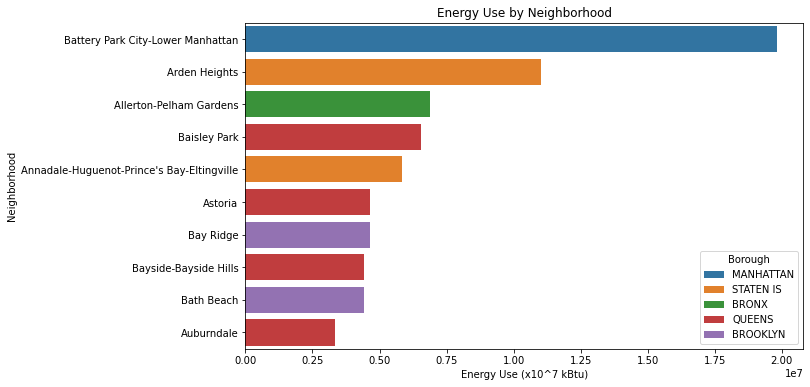

In [177]:
sns.barplot(y=energy_use_by_borough['NTA'], x=energy_use_by_borough['Weather Normalized Site Energy Use (kBtu)'],
           hue=energy_use_by_borough['Borough'], dodge=False)
plt.xlabel('Energy Use (x10^7 kBtu)')
plt.ylabel('Neighborhood')
plt.title('Energy Use by Neighborhood')
plt.show()

### Looking at median energy usage (neighborhood wise), although Lower Manhattan occupied top most position, the areas of Queens and Staten Island also used high amount of energy

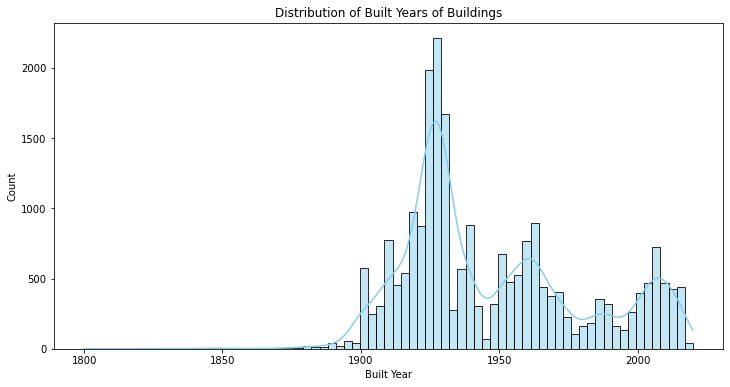

In [178]:
# Question) What is the distribution of building age in NYC?


plt.figure(figsize=(12, 6))
sns.histplot(data=df, x=df['Year Built'], kde=True, color='skyblue', edgecolor='black')
plt.title('Distribution of Built Years of Buildings')
plt.xlabel('Built Year')
plt.ylabel('Count')
plt.show()

### An overwhelming amount of NYC buildings were built before 1970s and thus are atleast 50 years old. Howeverm we can also a building boom in the first half of 20th century

### The ENERGY STAR Score is a measure of how well your property is performing relative to similar properties, when normalized for climate and operational characteristics. The 1-100 scale is set so that 1 represents the worst performing buildings and 100 represents the best performing buildings. A score of 50 indicates that a building is performing at the national median, taking into account its size, location, and operating parameters. A score of 75 indicates that a property is performing in the 75th percentile.

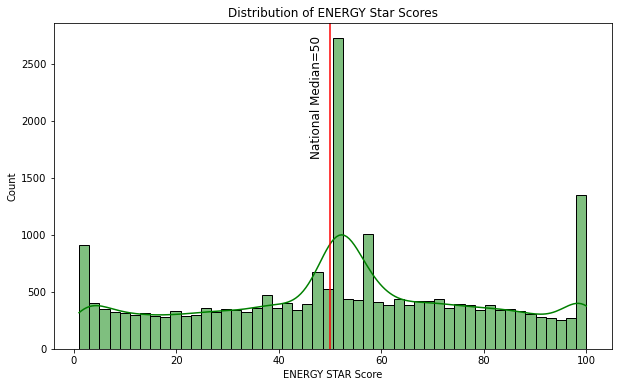

In [179]:
# Question) How are the buildings in NYC performing as compared to national median?  
# Creating a histplot to see the performance of buildings in NYC vis-à-vis the national median

sns.histplot(df['ENERGY STAR Score'], bins=50, kde=True, color='green')
plt.axvline(x=50, color='red')
plt.text(46,1700, 'National Median=50', rotation=90, fontsize=12, )
plt.title('Distribution of ENERGY Star Scores')
plt.show()

### We can observe that buildings of NYC are performing at national median levels. With high incentives and awareness, the median ENERGY Star Scores can be improved and NYC can be transformed into a model city for energy sustainability

In [180]:
# Question) Which type of buildings consume the most energy?  


energy_use_by_type_df=df.groupby('Primary Property Type - Portfolio Manager-Calculated')[['Weather Normalized Site Energy Use (kBtu)']].agg({
    'Weather Normalized Site Energy Use (kBtu)': 'median'
}).reset_index().sort_values(by=['Weather Normalized Site Energy Use (kBtu)'], ascending=False).reset_index().drop('index', axis=1)[:10]
energy_use_by_type_df

,Primary Property Type - Portfolio Manager-Calculated,Weather Normalized Site Energy Use (kBtu)
0,Wastewater Treatment Plant,1.721251e+08
1,Hospital (General Medical & Surgical),1.082642e+08
2,Ambulatory Surgical Center,9.487284e+07
3,Laboratory,9.252756e+07
4,Enclosed Mall,6.545385e+07
5,Financial Office,3.792333e+07
6,Courthouse,2.126164e+07
7,Wholesale Club/Supercenter,1.649800e+07
8,Outpatient Rehabilitation/Physical Therapy,1.456802e+07
9,Prison/Incarceration,1.413187e+07


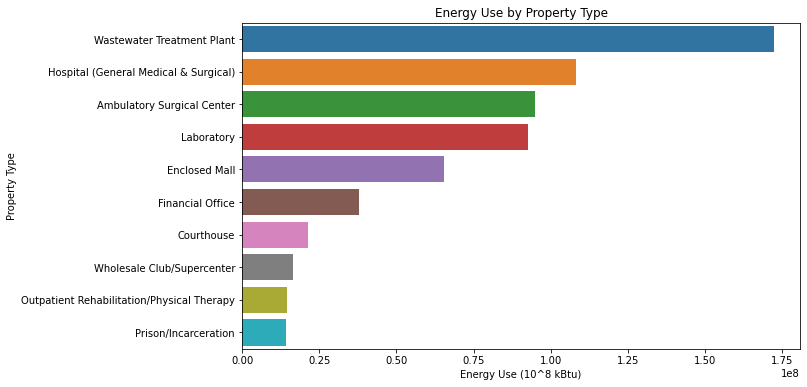

In [181]:
sns.barplot(x=energy_use_by_type_df['Weather Normalized Site Energy Use (kBtu)'],
           y=energy_use_by_type_df['Primary Property Type - Portfolio Manager-Calculated'])
plt.title('Energy Use by Property Type')
plt.xlabel('Energy Use (10^8 kBtu)')
plt.ylabel('Property Type')
plt.show()

### Highest median consumption of energy comes from utility and medical services

In [182]:
emissions_by_type_df=df.groupby('Primary Property Type - Portfolio Manager-Calculated')[['Net Emissions (Metric Tons CO2e)']].agg({
    'Net Emissions (Metric Tons CO2e)': 'median'
}).reset_index().sort_values(by=['Net Emissions (Metric Tons CO2e)'], ascending=False).reset_index().drop('index', axis=1)[:10]
emissions_by_type_df

,Primary Property Type - Portfolio Manager-Calculated,Net Emissions (Metric Tons CO2e)
0,Wastewater Treatment Plant,13108.40
1,Laboratory,7094.30
2,Ambulatory Surgical Center,6912.00
3,Hospital (General Medical & Surgical),6893.80
4,Enclosed Mall,4678.85
5,Financial Office,2851.40
6,Courthouse,1527.70
7,Other - Specialty Hospital,1230.25
8,Wholesale Club/Supercenter,1230.20
9,Outpatient Rehabilitation/Physical Therapy,1056.80


In [183]:
df.columns

Index(['Property Id', 'Property Name', 'Address 1', 'Postcode',
       'Primary Property Type - Portfolio Manager-Calculated', 'Year Built',
       'Number of Buildings', 'Occupancy', 'Metered Areas (Energy)',
       'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Weather Normalized Site EUI (kBtu/ft²)',
       '% Difference from National Median Site EUI',
       'Weather Normalized Site Energy Use (kBtu)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Weather Normalized Site Natural Gas Use (therms)',
       'Weather Normalized Site Electricity (kWh)',
       'Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)',
       'Green Power - Offsite (kWh)',
       'Avoided Emissions - Offsite Green Power (Metric Tons CO2e)',
       'National Median Total GHG Emissions (Metric Tons CO2e)',
       'eGRID Output Emissions Rate (kgCO2e/MBtu)',
       'Net Emissio

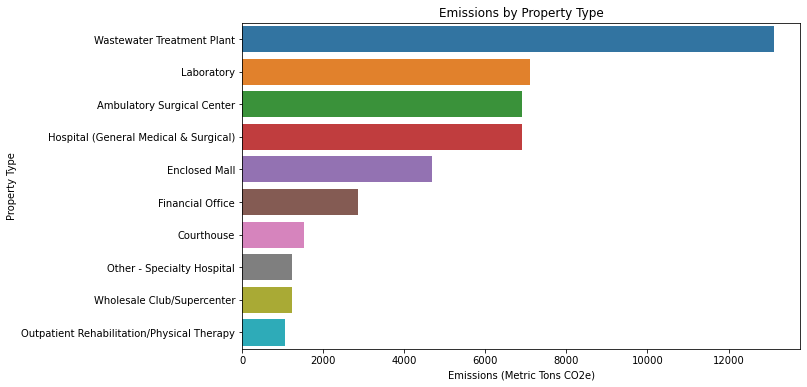

In [184]:
sns.barplot(x=emissions_by_type_df['Net Emissions (Metric Tons CO2e)'],
           y=emissions_by_type_df['Primary Property Type - Portfolio Manager-Calculated'])
plt.title('Emissions by Property Type')
plt.xlabel('Emissions (Metric Tons CO2e)')
plt.ylabel('Property Type')
plt.show()

### Here too, the median emissions of utility and medical services are higher. Not every property can be expected to curtail down their usage, but some like Malls, Financial Offices and Courthouse can be included into focus property types to bring the emissions down

In [185]:
# Question) What is the water usage of different properties?

water_use_by_type_df=df.groupby('Primary Property Type - Portfolio Manager-Calculated')[['Water Use (All Water Sources) (kgal)']].agg({
    'Water Use (All Water Sources) (kgal)': 'median'
}).reset_index().sort_values(by=['Water Use (All Water Sources) (kgal)'], ascending=False).reset_index().drop('index', axis=1)[:10]
water_use_by_type_df

,Primary Property Type - Portfolio Manager-Calculated,Water Use (All Water Sources) (kgal)
0,Ambulatory Surgical Center,34457.70
1,Other - Restaurant/Bar,12714.35
2,Enclosed Mall,11883.30
3,Courthouse,10184.80
4,Hospital (General Medical & Surgical),9227.35
5,Senior Care Community,7587.50
6,Hotel,6811.60
7,Financial Office,6751.80
8,Movie Theater,5478.50
9,Residential Care Facility,5127.65


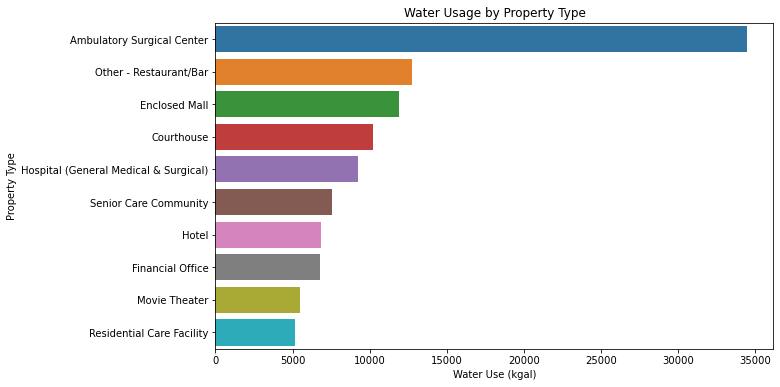

In [186]:
sns.barplot(x=water_use_by_type_df['Water Use (All Water Sources) (kgal)'],
           y=water_use_by_type_df['Primary Property Type - Portfolio Manager-Calculated'])
plt.title('Water Usage by Property Type')
plt.xlabel('Water Use (kgal)')
plt.ylabel('Property Type')
plt.show()

### The median water usage of medical services cannot be controlled but restaurants, malls and government buildings can be included into the focus areas.

In [187]:
boroughs_by_resource_intensity=df.groupby('Borough')[['Weather Normalized Site Electricity Intensity (kWh/ft²)','Weather Normalized Site Natural Gas Intensity (therms/ft²)']].agg({
   'Weather Normalized Site Electricity Intensity (kWh/ft²)': 'median',
    'Weather Normalized Site Natural Gas Intensity (therms/ft²)': 'median'
}).reset_index()
boroughs_by_resource_intensity

,Borough,Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²)
0,BRONX,4.8,0.6
1,BROOKLYN,4.5,0.6
2,MANHATTAN,7.3,0.3
3,QUEENS,4.8,0.6
4,STATEN IS,6.6,0.4


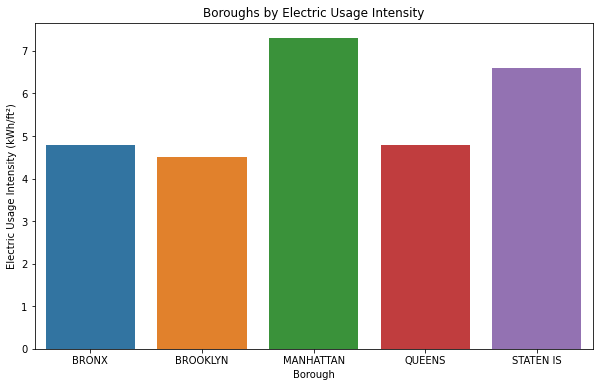

In [188]:
# Visualizing Electric Usage Intensity by Boroughs

sns.barplot(x=boroughs_by_resource_intensity['Borough'], y=boroughs_by_resource_intensity['Weather Normalized Site Electricity Intensity (kWh/ft²)'])
plt.ylabel('Electric Usage Intensity (kWh/ft²)')
plt.xlabel('Borough')
plt.title('Boroughs by Electric Usage Intensity')
plt.show()

### Manhattan has the highest intensity of electricity usage followed by Staten Island

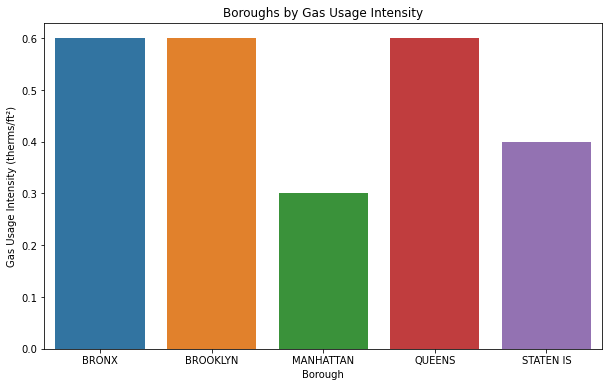

In [189]:
# Visualizing Natural Gas Usage Intensity by Boroughs

sns.barplot(x=boroughs_by_resource_intensity['Borough'], y=boroughs_by_resource_intensity['Weather Normalized Site Natural Gas Intensity (therms/ft²)'])
plt.ylabel('Gas Usage Intensity (therms/ft²)')
plt.xlabel('Borough')
plt.title('Boroughs by Gas Usage Intensity')
plt.show()

### The suburban areas have higher intensity of natural gas usage as compared to Manhattan

In [190]:
# Finding average summer lST neighborhood wise

avg_summer_nta=df.groupby('NTA')[['Average Summer Land Surface Temp (F)']].mean().reset_index()
avg_summer_nta

,NTA,Average Summer Land Surface Temp (F)
0,Allerton-Pelham Gardens,100.3
1,Annadale-Huguenot-Prince's Bay-Eltingville,95.9
2,Arden Heights,97.7
3,Astoria,97.6
4,Auburndale,101.4
...,...,...
183,Windsor Terrace,95.6
184,Woodhaven,100.4
185,Woodlawn-Wakefield,99.2
186,Woodside,100.2


In [191]:
# Question) What is the geographic distribution of energy usage, natural gas and electricity consumption

import folium
import geopandas as gpd

In [192]:
# Importing the geojson file for geographic visualization. 
# We have used folium library to create maps

geo_data=gpd.read_file('data/Original Data/NTA2010.json')

In [193]:
map_center = [40.7128, -74.0060]
zoom_level = 10

In [194]:
geo_data

,OBJECTID,BoroCode,BoroName,CountyFIPS,NTACode,NTAName,Shape__Area,Shape__Length,geometry
0,1,4,Queens,081,QN08,St. Albans,7.741276e+07,45401.225284,"POLYGON ((-73.75205 40.70524, -73.75175 40.704..."
1,2,4,Queens,081,QN55,South Ozone Park,8.246139e+07,36708.169305,"POLYGON ((-73.80577 40.68294, -73.80552 40.682..."
2,3,3,Brooklyn,047,BK50,Canarsie,8.208973e+07,43703.355420,"MULTIPOLYGON (((-73.88834 40.64672, -73.88835 ..."
3,4,2,Bronx,005,BX41,Mount Hope,1.471671e+07,18937.247819,"POLYGON ((-73.89561 40.85458, -73.89663 40.852..."
4,5,4,Queens,081,QN26,North Corona,1.800385e+07,18429.533493,"POLYGON ((-73.85450 40.75829, -73.85421 40.757..."
...,...,...,...,...,...,...,...,...,...
190,191,2,Bronx,005,BX27,Hunts Point,4.969316e+07,43701.934959,"POLYGON ((-73.88439 40.82296, -73.88436 40.822..."
191,192,2,Bronx,005,BX37,Van Nest-Morris Park-Westchester Square,3.632031e+07,42634.621022,"POLYGON ((-73.83129 40.85544, -73.83158 40.855..."
192,193,2,Bronx,005,BX99,park-cemetery-etc-Bronx,2.214208e+08,224680.811087,"MULTIPOLYGON (((-73.86956 40.81617, -73.86955 ..."
193,194,3,Brooklyn,047,BK83,Cypress Hills-City Line,2.760957e+07,35563.994916,"POLYGON ((-73.86335 40.67936, -73.86331 40.679..."


In [195]:
# Merging geo_data with our dataframe on 'NTA'

merged_df=pd.merge(df, geo_data, left_on='NTA', right_on='NTAName', how='inner')

In [196]:
merged_df.isna().sum()

Property Id                                                                           0
Property Name                                                                         0
Address 1                                                                             0
Postcode                                                                              0
Primary Property Type - Portfolio Manager-Calculated                                  0
Year Built                                                                            0
Number of Buildings                                                                   0
Occupancy                                                                             0
Metered Areas (Energy)                                                                0
Metered Areas  (Water)                                                                0
ENERGY STAR Score                                                                     0
Weather Normalized Site EUI (kBt

In [197]:
df['NTA'].nunique()

188

In [198]:
geo_data['NTAName'].nunique()

195

In [199]:
# merged_df['Average Summer Land Surface Temp (F)', 'NTAName']

In [200]:
# Grouping summer land surface temperature with NTA and creating a new dataframe named temp_df

temp_df=merged_df.groupby('NTAName')[['Average Summer Land Surface Temp (F)']].mean().reset_index()

In [201]:
# Creating a map of summer surface temp distribution of NYC

title='''<h3 align='center'style='font-size:20px'> <b>Average Summer Temperatures (Degrees F) in NYC</b></h3>'''

nyc_map=folium.Map(location=map_center, zoom_start=zoom_level)

nyc_map.get_root().html.add_child(folium.Element(title))

folium.Choropleth(
    geo_data=geo_data,
    data=temp_df,
    columns=['NTAName', 'Average Summer Land Surface Temp (F)'],
    key_on='feature.properties.NTAName',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Surface Temperature (F)',
    nan_fill_color='gray'
).add_to(nyc_map)



In [202]:
nyc_map

In [203]:
electicity_df=merged_df.groupby('NTAName')[['Average Summer Electricity Usage (kBtu)']].mean().reset_index()

In [204]:
# Our electricity values have high difference between lowest and highest usage. 
# Hence to properly visualize it on map, we had applied log transformation

electicity_df['Transformed Usage'] = np.log1p(electicity_df['Average Summer Electricity Usage (kBtu)'])
electicity_df

,NTAName,Average Summer Electricity Usage (kBtu),Transformed Usage
0,Allerton-Pelham Gardens,215681.223810,12.281561
1,Annadale-Huguenot-Prince's Bay-Eltingville,290014.808333,12.577691
2,Arden Heights,290400.283333,12.579019
3,Astoria,173052.654889,12.061357
4,Auburndale,206128.342424,12.236259
...,...,...,...
183,Windsor Terrace,135818.006667,11.819078
184,Woodhaven,193624.867901,12.173683
185,Woodlawn-Wakefield,101486.046784,11.527686
186,Woodside,192147.147556,12.166022


In [205]:
# Visulazing the summer electricity consumption in NYC

title='''<h3 align='center'style='font-size:20px'> <b>Average Summer Electricity Consumption in NYC</b></h3>'''

nyc_electricity_map=folium.Map(location=map_center, zoom_start=zoom_level)

nyc_electricity_map.get_root().html.add_child(folium.Element(title))

folium.Choropleth(
    geo_data=geo_data,
    data=electicity_df,
    columns=['NTAName', 'Transformed Usage'],
    key_on='feature.properties.NTAName',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='kBtu',
    nan_fill_color='gray'
).add_to(nyc_electricity_map)
nyc_electricity_map

In [206]:
# Our natural gas usage values have also high difference between lowest and highest usage. 
# Hence to properly visualize it on map, we had applied log transformation

gas_df=merged_df.groupby('NTAName')[['Average Summer Gas Usage (kBtu)']].mean().reset_index()
gas_df['Transformed Usage'] = np.log1p(gas_df['Average Summer Gas Usage (kBtu)'])


In [207]:
# Visulazing the summer electricity consumption in NYC

title='''<h3 align='center'style='font-size:20px'> <b>Average Natural Gas Consumption in NYC</b></h3>'''

nyc_gas_map=folium.Map(location=map_center, zoom_start=zoom_level)

nyc_gas_map.get_root().html.add_child(folium.Element(title))

folium.Choropleth(
    geo_data=geo_data,
    data=gas_df,
    columns=['NTAName', 'Transformed Usage'],
    key_on='feature.properties.NTAName',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='kBtu',
    nan_fill_color='gray'
).add_to(nyc_gas_map)
nyc_gas_map

## Model Building

### The model building stage is a crucial stage in a data science project. Here are three key points about the model building stage in a data science project:

#### Algorithm Selection:

Choosing the right algorithm based on the problem and data characteristics.
Experimenting with various algorithms and compare their performance.

#### Feature Engineering:

Preprocessing and transforming features for better model performance.
Selecting relevant features.

#### Model Training and Evaluation:

Splitting data for training and testing to assess model performance.
Training the model, adjusting its hyperparameters, and evaluating with appropriate metrics.

### In this project, we have the input data as df

In [208]:
df

,Property Id,Property Name,Address 1,Postcode,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),...,Water Score (Multifamily Only),Irrigated Area (ft²),Borough,Latitude,Longitude,NTA,Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
0,7365,1155,1155 Avenue of the Americas,10036,Office,1982,1,40,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.756631,-73.982826,Midtown-Midtown South,685705.9,3.826703e+04,2.098590e+06,97.5
1,8604,114,114 West 47th st,10036,Financial Office,1989,1,95,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.758310,-73.982504,Midtown-Midtown South,577534.0,7.252220e+04,2.516934e+06,97.5
2,11809,Conde Nast Building,4 Times Square,10036,Office,1999,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.756181,-73.986244,Midtown-Midtown South,1601977.0,4.203740e+05,9.892624e+06,97.5
3,1045358,320 Park Avenue,320 Park Avenue,10022,Financial Office,1994,1,95,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.757450,-73.973798,Midtown-Midtown South,721979.0,1.098052e+05,4.541031e+06,97.5
4,1151970,1133,1133 Avenue of the Americas,10036,Office,1968,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.755942,-73.983324,Midtown-Midtown South,1001539.0,3.826703e+04,4.975748e+06,97.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22699,7386500,91-16 Shore Front Parkway,9116 SHORE FRONT PKWY,11693,Multifamily Housing,2005,1,100,Whole Building,Whole Building,...,15.0,0.0,QUEENS,40.584402,-73.813196,Hammels-Arverne-Edgemere,51940.0,1.223433e+04,1.521775e+05,93.7
22700,2774477,ConEd East 16th Street-750 E16,750 East 16th Street,10009,Office,1970,1,100,Whole Building,Whole Building,...,0.0,0.0,MANHATTAN,40.729250,-73.973506,Stuyvesant Town-Cooper Village,119433.0,2.786667e+03,1.528045e+05,94.1
22701,4157734,Peter Cooper Village,360 First Avenue,10010,Multifamily Housing,1947,21,100,Whole Building,Whole Building,...,15.0,0.0,MANHATTAN,40.735712,-73.979223,Stuyvesant Town-Cooper Village,3122165.0,6.045634e+05,5.966441e+06,94.1
22702,4157757,Stuyvesant Town,252 First Ave,10009,Multifamily Housing,1947,35,100,Whole Building,Whole Building,...,40.0,0.0,MANHATTAN,40.731903,-73.982013,Stuyvesant Town-Cooper Village,8942176.0,1.957044e+06,1.785970e+07,94.1


### We are dropping identifier and location attributes from the dataset so that we can simplify the model building process

In [209]:
# Dropping the required columns

df.drop(columns=['Property Id', 'Property Name', 'Address 1', 'Postcode', 'Latitude', 'Longitude'], inplace=True)

In [210]:
df

,Primary Property Type - Portfolio Manager-Calculated,Year Built,Number of Buildings,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Weather Normalized Site EUI (kBtu/ft²),% Difference from National Median Site EUI,Weather Normalized Site Energy Use (kBtu),...,Water Use (All Water Sources) (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Borough,NTA,Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
0,Office,1982,1,40,Whole Building,Whole Building,79.0,45.8,-36.2,31371842.5,...,2159.6,17.380,0.0,0.0,MANHATTAN,Midtown-Midtown South,685705.9,3.826703e+04,2.098590e+06,97.5
1,Financial Office,1989,1,95,Whole Building,Whole Building,66.0,70.3,-19.9,40596756.9,...,6751.8,22.270,0.0,0.0,MANHATTAN,Midtown-Midtown South,577534.0,7.252220e+04,2.516934e+06,97.5
2,Office,1999,1,100,Whole Building,Whole Building,42.0,101.5,10.5,162536934.7,...,2159.6,17.380,0.0,0.0,MANHATTAN,Midtown-Midtown South,1601977.0,4.203740e+05,9.892624e+06,97.5
3,Financial Office,1994,1,95,Whole Building,Whole Building,60.0,88.3,-11.2,63740699.7,...,21519.6,29.810,0.0,0.0,MANHATTAN,Midtown-Midtown South,721979.0,1.098052e+05,4.541031e+06,97.5
4,Office,1968,1,100,Whole Building,Whole Building,71.0,76.1,-25.8,74320696.2,...,2159.6,17.380,0.0,0.0,MANHATTAN,Midtown-Midtown South,1001539.0,3.826703e+04,4.975748e+06,97.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22699,Multifamily Housing,2005,1,100,Whole Building,Whole Building,90.0,35.2,-29.6,1827937.0,...,3896.1,62.360,15.0,0.0,QUEENS,Hammels-Arverne-Edgemere,51940.0,1.223433e+04,1.521775e+05,93.7
22700,Office,1970,1,100,Whole Building,Whole Building,58.0,146.4,76.1,17479208.9,...,2159.6,17.380,0.0,0.0,MANHATTAN,Stuyvesant Town-Cooper Village,119433.0,2.786667e+03,1.528045e+05,94.1
22701,Multifamily Housing,1947,21,100,Whole Building,Whole Building,83.0,55.4,-22.6,172836432.7,...,3896.1,62.360,15.0,0.0,MANHATTAN,Stuyvesant Town-Cooper Village,3122165.0,6.045634e+05,5.966441e+06,94.1
22702,Multifamily Housing,1947,35,100,Whole Building,Whole Building,84.0,59.2,-23.5,529556641.9,...,428743.0,47.950,40.0,0.0,MANHATTAN,Stuyvesant Town-Cooper Village,8942176.0,1.957044e+06,1.785970e+07,94.1


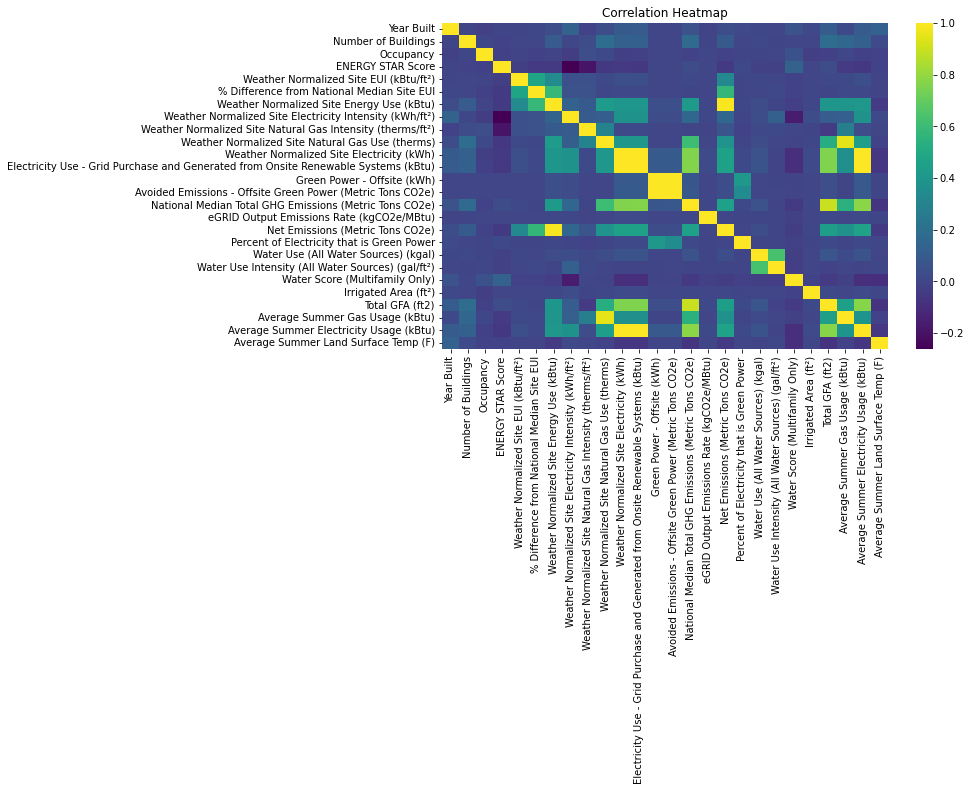

In [211]:
# Creating a heat map to see the corelated features

plt.rcParams['figure.figsize']=(10, 6)
sns.heatmap(df.corr(), cmap='viridis')
plt.title('Correlation Heatmap')
plt.show()

### There are two target variables in our project namely 'Weather Normalized Site Energy Use (kBtu)' and 'Average Summer Land Surface Temp (F)' which are numerical values. We have applied models separately to both of them

In [212]:
corr_target_1=df.corrwith(df['Weather Normalized Site Energy Use (kBtu)']).abs().reset_index()
corr_target_1.columns=['Feature', 'Correlation Coefficient']
corr_target_1=corr_target_1.sort_values(by=['Correlation Coefficient'], ascending=False).reset_index(drop=True)
corr_target_1.drop(index=0, inplace=True)
corr_target_1=corr_target_1[:10]
corr_target_1

,Feature,Correlation Coefficient
1,Net Emissions (Metric Tons CO2e),0.985716
2,% Difference from National Median Site EUI,0.584707
3,Weather Normalized Site Natural Gas Use (therms),0.424373
4,National Median Total GHG Emissions (Metric To...,0.422696
5,Average Summer Electricity Usage (kBtu),0.411905
6,Weather Normalized Site Electricity (kWh),0.401064
7,Electricity Use - Grid Purchase and Generated ...,0.400918
8,Total GFA (ft2),0.399209
9,Average Summer Gas Usage (kBtu),0.398124
10,Weather Normalized Site EUI (kBtu/ft²),0.338042


In [213]:
corr_target_2=df.corrwith(df['Average Summer Land Surface Temp (F)']).abs().reset_index()
corr_target_2.columns=['Feature', 'Correlation Coefficient']
corr_target_2=corr_target_2.sort_values(by=['Correlation Coefficient'], ascending=False).reset_index(drop=True)
corr_target_2.drop(index=0, inplace=True)
corr_target_2=corr_target_2[:10]
corr_target_2

,Feature,Correlation Coefficient
1,Year Built,0.123395
2,Water Score (Multifamily Only),0.093295
3,Total GFA (ft2),0.076042
4,National Median Total GHG Emissions (Metric To...,0.066246
5,Average Summer Electricity Usage (kBtu),0.062429
6,Electricity Use - Grid Purchase and Generated ...,0.060744
7,Weather Normalized Site Electricity (kWh),0.060447
8,Net Emissions (Metric Tons CO2e),0.048743
9,Weather Normalized Site Energy Use (kBtu),0.044070
10,Number of Buildings,0.023648


In [214]:
# Importing necessary libraries

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')

In [215]:
# Finding numerical and categorical features

num_features=df.select_dtypes(include=['float', 'int']).columns.tolist()
cat_features=df.select_dtypes(include=['object']).columns.tolist()

In [216]:
# Converting categorical features using OneHotEncoder()

enc=OneHotEncoder()
encoded_features=enc.fit_transform(df[cat_features])
encoded_features_df=pd.DataFrame(encoded_features.toarray(), columns=enc.get_feature_names_out(cat_features))

In [217]:
# Converting numerical features using StandardScalar()

scalar=StandardScaler()
df[num_features]=scalar.fit_transform(df[num_features])

In [218]:
# Creating a new dataframe which consists of standardized and encoded data

encoded_standardized_df=pd.concat([encoded_features_df, df[num_features]], axis=1)
encoded_standardized_df

,Primary Property Type - Portfolio Manager-Calculated_Adult Education,Primary Property Type - Portfolio Manager-Calculated_Ambulatory Surgical Center,Primary Property Type - Portfolio Manager-Calculated_Automobile Dealership,Primary Property Type - Portfolio Manager-Calculated_Bank Branch,Primary Property Type - Portfolio Manager-Calculated_Bowling Alley,Primary Property Type - Portfolio Manager-Calculated_College/University,Primary Property Type - Portfolio Manager-Calculated_Convenience Store without Gas Station,Primary Property Type - Portfolio Manager-Calculated_Courthouse,Primary Property Type - Portfolio Manager-Calculated_Distribution Center,Primary Property Type - Portfolio Manager-Calculated_Enclosed Mall,...,Net Emissions (Metric Tons CO2e),Percent of Electricity that is Green Power,Water Use (All Water Sources) (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.424729,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,2.463886,-0.101177,1.464657,-0.229422
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.580236,-0.037401,0.011669,-0.086461,-0.702377,-0.036289,1.992088,-0.082061,1.823815,-0.229422
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.790372,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,6.460258,0.112062,8.156015,-0.229422
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.065886,-0.037401,0.279294,-0.074840,-0.702377,-0.036289,2.622093,-0.061254,3.561549,-0.229422
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.191805,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,3.841411,-0.101177,3.934764,-0.229422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.156982,-0.037401,-0.040082,-0.024671,-0.025059,-0.036289,-0.300322,-0.115705,-0.206383,-2.329137
22700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.107960,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,-0.005947,-0.120977,-0.205845,-2.108114
22701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.844771,-0.037401,-0.040082,-0.024671,-0.025059,-0.036289,13.090649,0.214851,4.785296,-2.108114
22702,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.986761,0.726021,7.659078,-0.046881,1.103804,-0.036289,38.474977,0.969618,14.995939,-2.108114


### Predicting our first target variable i.e. 'Weather Normalized Site Energy Use (kBtu)'

In [219]:
# Seperating target and predictor features

X = encoded_standardized_df.drop(columns=['Weather Normalized Site Energy Use (kBtu)'])
y = encoded_standardized_df['Weather Normalized Site Energy Use (kBtu)']

In [220]:
# Splitting the data into training and testing set with a test size of 0.2

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### SInce, there are 294 features and the size of data is very high, we need to reduce the dimensionality of the data. We have employed Principal Components Analysis (PCA) to reduce the number of features

#### Principal Component Analysis (PCA):
PCA is a dimensionality reduction technique used in data science. It transforms a dataset into a new coordinate system, capturing the variance in the data by identifying principal components. These components are linear combinations of the original features, ordered by the amount of variance they explain. PCA is useful for simplifying complex datasets while retaining essential information.

#### Scree Plot:
A Scree Plot is a graphical tool used in PCA to help determine the number of principal components to retain. It displays the eigenvalues (amount of variance) of each principal component. The plot typically shows a steep decline in eigenvalues followed by a flattening out. The "elbow" point, where the eigenvalues sharply drop, suggests the optimal number of principal components to keep. This aids in balancing the trade-off between dimensionality reduction and retaining significant information in the data.

In [221]:
# Initially applying PCA to all features

pca_matrix=PCA(n_components=len(X_train.columns))
pca_matrix.fit(X_train)

PCA(n_components=294)

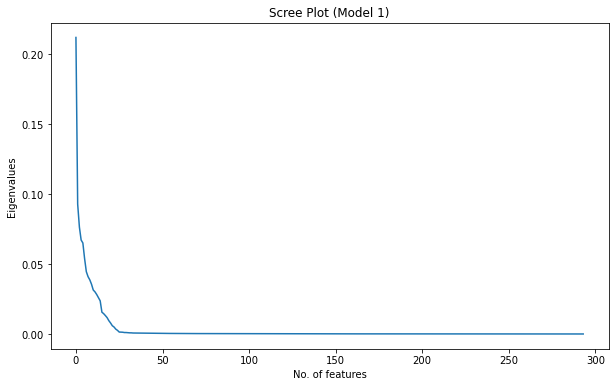

In [222]:
# Visualizing using Scree Plot

plt.plot(pca_matrix.explained_variance_ratio_)
plt.xlabel('No. of features')
plt.ylabel('Eigenvalues')
plt.title('Scree Plot (Model 1)')
plt.show()

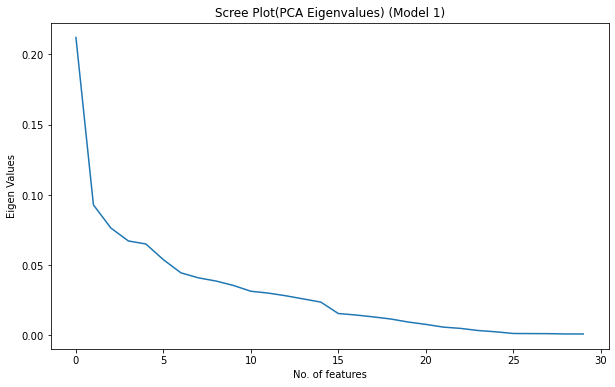

In [223]:
# Reducing the n_components of PCA to magnify the scree plot

pca_matrix=PCA(30)
pca_matrix.fit(X_train)
plt.plot(pca_matrix.explained_variance_ratio_)
plt.title('Scree Plot(PCA Eigenvalues) (Model 1)')
plt.xlabel('No. of features')
plt.ylabel('Eigen Values')
plt.show()

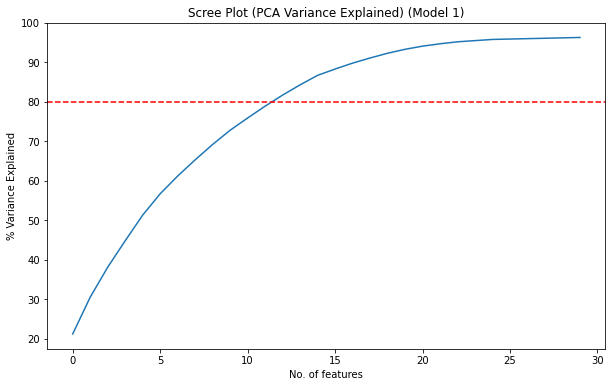

In [224]:
# Also visualizing scree plot using variance explained. 

variance=pca_matrix.explained_variance_ratio_
var=np.cumsum(np.round(pca_matrix.explained_variance_ratio_, decimals=3)*100)

plt.plot(var)
plt.axhline(y=80, color='r', linestyle='--')
plt.title('Scree Plot (PCA Variance Explained) (Model 1)')
plt.xlabel('No. of features')
plt.ylabel('% Variance Explained')
plt.show()

### From above visualizations, we can say that around 11-12 should be the n_components as they explain around 80% of variance in the target. We have used n_components = 12

In [225]:
# Applying PCA with n_components=12

pca = PCA(n_components=12)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

### Models Used

Since our problem is regression problem, we have narrowed down to the following machine learning models for predicting the target variables:
1) Lasso Regressor  
2) Ridge Regressor  
3) Random Forest  
4) Gradient Booster  
5) SVR (Support Vector Regressor)   

### A brief about different models:

#### Ridge Regression:

1) Ridge regression is a linear regression model with regularization, adding a penalty term to the cost function based on the L2 norm of the coefficients.  
2) It helps prevent overfitting by discouraging overly complex models, promoting smoother solutions with smaller coefficient values.  
3) Ridge is effective when multicollinearity (high correlation among predictors) is present in the dataset.

#### Lasso Regression:

1) Lasso regression is another linear regression model with regularization, but it uses the L1 norm penalty term.  
2) It encourages sparsity in the model by driving some coefficients to exactly zero, effectively performing feature selection.  
3) Lasso is particularly useful when dealing with datasets with many features, selecting a subset of the most relevant predictors.

#### Random Forest:

1) Random Forest is an ensemble learning method that constructs a multitude of decision trees during training and outputs the average prediction of the individual trees.  
2) It provides high accuracy, handles complex relationships, and is robust to overfitting due to the aggregation of multiple trees.  
3) Random Forest is versatile and suitable for various regression tasks, requiring minimal hyperparameter tuning.

#### Gradient Boosting:

1) Gradient Boosting is an ensemble technique that builds a series of weak learners (usually decision trees) sequentially, each correcting the errors of its predecessor.  
3) It optimizes a cost function through the iterative addition of trees, resulting in a powerful predictive model.  
3) Gradient Boosting is effective for capturing complex relationships and is widely used for regression tasks.

#### Support Vector Regression (SVR):

1) SVR is a regression model based on Support Vector Machines, aiming to find a hyperplane that fits the data while minimizing the error.  
2) It uses a kernel trick to map the input data into a higher-dimensional space, allowing for the capture of nonlinear relationships.  
3) SVR is robust in high-dimensional spaces and is particularly useful when dealing with datasets with complex patterns.






In [226]:
# Initializing the models

lasso_model=Lasso()
ridge_model=Ridge()
rf_model=RandomForestRegressor()
gb_model=GradientBoostingRegressor()
svr=SVR()

In [227]:
# Creating a hyperparameter grid

lasso_param_grid={'alpha': [0.001, 0.01, 0.1, 10, 100]}
ridge_param_grid={'alpha': [0.001, 0.01, 0.1, 10, 100]}
rf_param_grid={'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5, 10]}
gb_param_grid={'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth':[3, 5, 10]}
svr_param_grid={'C': [0.1, 1, 10], 'gamma': ['scale', 'auto'], 'kernel': ['rbf', 'linear']}

In [228]:
# Creating a model dictionary

models={
    'Lasso': (lasso_model, lasso_param_grid),
    'Ridge': (ridge_model, ridge_param_grid),
    'Random Forest': (rf_model, rf_param_grid),
    'Gradient Boosting': (gb_model, gb_param_grid),
    'SVR': (svr, svr_param_grid)
}

In [229]:
# Using r2 score as the main scorer and creating a dataframe to store the results

r2_scorer=make_scorer(r2_score)
results_df=pd.DataFrame(columns=['Model', 'Best Hyperparameters', 'Best R2 Score', 'R2 (Test Set)',
                                'Average R2 (CV)'])

In [230]:
# Training the model using GridSearchCV and evaluation of model on different folds of training data using cross validation

for model_name, (model, param_grid) in models.items():
    print(f'---{model_name}---')
    gs=GridSearchCV(model, param_grid, scoring=r2_scorer, cv=5, n_jobs=-1)
    gs.fit(X_train_pca, y_train)
    best_params=gs.best_params_
    best_r2=gs.best_score_
    
    final_model=model.set_params(**best_params)
    final_model.fit(X_train_pca, y_train)
    
    y_pred=final_model.predict(X_test_pca)
    test_r2=r2_score(y_test, y_pred)
    
    cv_scores=cross_val_score(final_model, X_train_pca, y_train, cv=5, scoring=r2_scorer, n_jobs=-1)
    avg_cv_r2=np.mean(cv_scores)
    
    print('Best Hyperparameters:', best_params)
    print('Best R2:', best_r2)
    print('R2 Score on Test Set:', test_r2)
    print('Average R2 on Validation Set:', avg_cv_r2)
    
    results_df=results_df.append({
        'Model': model_name,
        'Best Hyperparameters': best_params,
        'Best R2 Score': best_r2,
        'R2 (Test Set)': test_r2,
        'Average R2 (CV)': avg_cv_r2
    }, ignore_index=True)


---Lasso---
Best Hyperparameters: {'alpha': 0.1}
Best R2: 0.5363876293323127
R2 Score on Test Set: 0.23981428225681756
Average R2 on Validation Set: 0.5363876293323127
---Ridge---
Best Hyperparameters: {'alpha': 100}
Best R2: 0.31065308377436257
R2 Score on Test Set: 0.07723161071434836
Average R2 on Validation Set: 0.31065308377436257
---Random Forest---
Best Hyperparameters: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 50}
Best R2: 0.7392493491922586
R2 Score on Test Set: 0.8823930098172899
Average R2 on Validation Set: 0.5060448841809981
---Gradient Boosting---
Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Best R2: 0.7205125074209869
R2 Score on Test Set: 0.8811910765179037
Average R2 on Validation Set: 0.733208565338319
---SVR---
Best Hyperparameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best R2: 0.44696087260261896
R2 Score on Test Set: 0.5247922837693715
Average R2 on Validation Set: 0.44696087260261896


### Above are the results of our model building for predicting 'Weather Normalized Site Energy Use (kBtu)'. As we can that the Gradient Boosting Model was our best model, followed by Random Forest. Also, the Ridge regression was the worst performing model.

In [231]:
results_df=results_df.iloc[:,[0,3]]
results_df.columns=['Model', 'R2']
results_df

,Model,R2
0,Lasso,0.239814
1,Ridge,0.077232
2,Random Forest,0.882393
3,Gradient Boosting,0.881191
4,SVR,0.524792


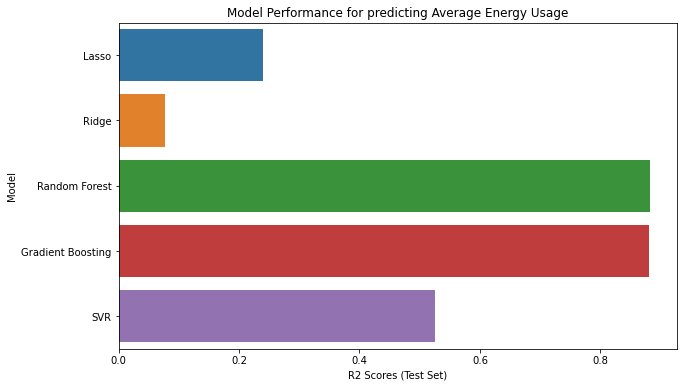

In [232]:
# Visualizing the R2 Score of different models

sns.barplot(x=results_df['R2'], y=results_df['Model'])
plt.xlabel("R2 Scores (Test Set)")
plt.title('Model Performance for predicting Average Energy Usage')
plt.show()

### Random Forest and Gradient Boosting were the best models with an R2 scores of roughly 0.88 whereas Ridge was worst with an R2 0.07 for predicting energy usage.

### Discussion regarding evaluation metric R Squared

The R2(R-squared) score is a metric used to assess the goodness of fit of a regression model. We have selected R Squared (R2) Score to compare different models. Here is some brief information about R2 metric:

#### Definition: 

The R2 score measures the proportion of the variance in the dependent variable that is predictable from the independent variables. It ranges from 0 to 1, with higher values indicating a better fit.

#### Interpretation:

An R2 score of 1 means the model perfectly predicts the dependent variable based on the independent variables.
An R2 score of 0 means the model does not explain any variability in the dependent variable.
Negative R2 values can occur when the model is a poor fit.

#### Model Comparison:

Higher R2 scores generally indicate better-performing models, as they explain a larger proportion of the variability in the data. When comparing models, the one with a higher R2 score is considered more effective in explaining and predicting the target variable.

### Discussion of Model Performance

1) Talking about high performance of Random Forest and Gradient Boosting, both Random Forest and Gradient Boosting are ensemble methods, combining multiple weak learners (trees) to create a strong predictive model. Ensemble methods often perform well because they can capture complex relationships and handle noisy data. The optimal hyperparameter tuning for Random Forest (max depth, min samples split, and number of trees) and Gradient Boosting (learning rate, max depth, and number of trees) might have allowed these models to fit the data better.  
2) The Ridge regression performed poorly because Ridge regression adds a penalty term (L2 norm) to the linear regression cost function. This penalty discourages large coefficients, but if the relationship in the data is not well-described by a linear model, Ridge may struggle to capture the underlying patterns. Also, Ridge does not perform feature selection as effectively as Lasso. If there are irrelevant features in the dataset, Ridge may not be as adept at excluding them, potentially leading to suboptimal performance.

### Our second target variable is 'Average Summer Land Surface Temp (F)'

In [233]:
# Splitting target and predictor variables

X2=encoded_standardized_df.drop(columns=['Average Summer Land Surface Temp (F)'])
y2=encoded_standardized_df['Average Summer Land Surface Temp (F)']

In [234]:
# Splitting X2 and y2 into training and testing set with a test size of 0.2

X_train_2, X_test_2, y_train_2, y_test_2=train_test_split(X2, y2, test_size=0.2, random_state=42)

In [235]:
# Here too, we will apply PCA and visualize it using Scree Plots

pca_matrix_2=PCA(n_components=len(X_train_2.columns))
pca_matrix_2.fit(X_train_2)

PCA(n_components=294)

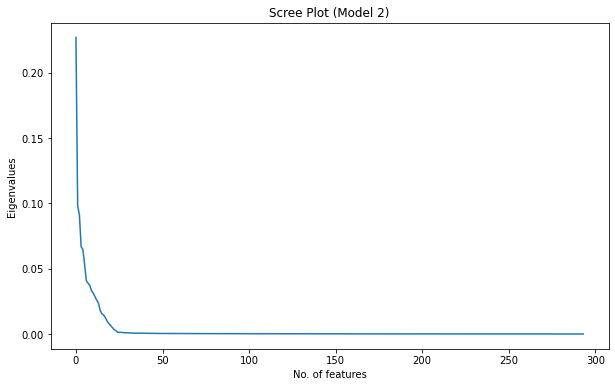

In [236]:
# Initially, applying PCA with n_components as number of features

plt.plot(pca_matrix_2.explained_variance_ratio_)
plt.xlabel('No. of features')
plt.ylabel('Eigenvalues')
plt.title('Scree Plot (Model 2)')
plt.show()

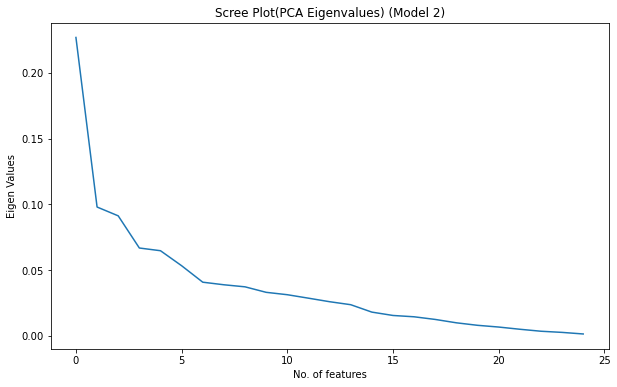

In [237]:
# Reducing the n_componets to 25 for better clarity

pca_matrix_2=PCA(25)
pca_matrix_2.fit(X_train_2)
plt.plot(pca_matrix_2.explained_variance_ratio_)
plt.title('Scree Plot(PCA Eigenvalues) (Model 2)')
plt.xlabel('No. of features')
plt.ylabel('Eigen Values')
plt.show()

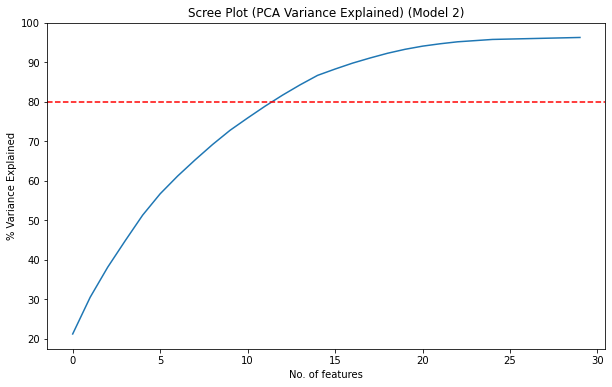

In [238]:
# Also, visualizing PCA with the % of variance explained

variance_2=pca_matrix_2.explained_variance_ratio_
var_2=np.cumsum(np.round(pca_matrix_2.explained_variance_ratio_, decimals=3)*100)

plt.plot(var)
plt.axhline(y=80, color='r', linestyle='--')
plt.title('Scree Plot (PCA Variance Explained) (Model 2)')
plt.xlabel('No. of features')
plt.ylabel('% Variance Explained')
plt.show()

### In this case too, the 11-12 features are enough to explain 80% of variance and we will select n_components = 12

In [239]:
# We selecting the following param grid for faster computation

models = {
    'Ridge': (Ridge(), {'alpha': [0.1, 1.0, 10.0]}),
    'Lasso': (Lasso(), {'alpha': [0.1, 1.0, 10.0]}),
    'RandomForest': (RandomForestRegressor(), {'n_estimators': [50, 100, 200]}),
    'GradientBoosting': (GradientBoostingRegressor(), {'n_estimators': [50, 100, 200]}),
    'SVR': (SVR(), {'C': [0.1, 1.0, 10.0], 'kernel': ['linear', 'rbf']})
}

In [240]:
# Creating a custom function to calculate adjusted R2 Scores

def adjusted_r2_score(y_true, y_pred, n_features):
    r2 = r2_score(y_true, y_pred)
    adjusted_r2 = 1 - (1 - r2) * (len(y_true) - 1) / (len(y_true) - n_features - 1)
    return adjusted_r2

In [241]:
# Creating numerical and categorical features

num_features=df.select_dtypes(include=['float', 'int']).columns.tolist()
cat_features=df.select_dtypes(include=['object']).columns.tolist()

In [242]:
# Encoding the categorical features using OneHotEncoder()

enc=OneHotEncoder()
encoded_features=enc.fit_transform(df[cat_features])
encoded_features_df=pd.DataFrame(encoded_features.toarray(), columns=enc.get_feature_names_out(cat_features))

In [243]:
# Encoding the numeric features using StandardScalar()

scalar=StandardScaler()
df[num_features]=scalar.fit_transform(df[num_features])

In [244]:
# Creating a new dataframe with encoded and standardized values

encoded_standardized_df=pd.concat([encoded_features_df, df[num_features]], axis=1)
encoded_standardized_df

,Primary Property Type - Portfolio Manager-Calculated_Adult Education,Primary Property Type - Portfolio Manager-Calculated_Ambulatory Surgical Center,Primary Property Type - Portfolio Manager-Calculated_Automobile Dealership,Primary Property Type - Portfolio Manager-Calculated_Bank Branch,Primary Property Type - Portfolio Manager-Calculated_Bowling Alley,Primary Property Type - Portfolio Manager-Calculated_College/University,Primary Property Type - Portfolio Manager-Calculated_Convenience Store without Gas Station,Primary Property Type - Portfolio Manager-Calculated_Courthouse,Primary Property Type - Portfolio Manager-Calculated_Distribution Center,Primary Property Type - Portfolio Manager-Calculated_Enclosed Mall,...,Net Emissions (Metric Tons CO2e),Percent of Electricity that is Green Power,Water Use (All Water Sources) (kgal),Water Use Intensity (All Water Sources) (gal/ft²),Water Score (Multifamily Only),Irrigated Area (ft²),Total GFA (ft2),Average Summer Gas Usage (kBtu),Average Summer Electricity Usage (kBtu),Average Summer Land Surface Temp (F)
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.424729,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,2.463886,-0.101177,1.464657,-0.229422
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.580236,-0.037401,0.011669,-0.086461,-0.702377,-0.036289,1.992088,-0.082061,1.823815,-0.229422
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.790372,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,6.460258,0.112062,8.156015,-0.229422
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.065886,-0.037401,0.279294,-0.074840,-0.702377,-0.036289,2.622093,-0.061254,3.561549,-0.229422
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.191805,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,3.841411,-0.101177,3.934764,-0.229422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.156982,-0.037401,-0.040082,-0.024671,-0.025059,-0.036289,-0.300322,-0.115705,-0.206383,-2.329137
22700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.107960,-0.037401,-0.071551,-0.093998,-0.702377,-0.036289,-0.005947,-0.120977,-0.205845,-2.108114
22701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.844771,-0.037401,-0.040082,-0.024671,-0.025059,-0.036289,13.090649,0.214851,4.785296,-2.108114
22702,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.986761,0.726021,7.659078,-0.046881,1.103804,-0.036289,38.474977,0.969618,14.995939,-2.108114


In [245]:
# Separating target and predictor features

X_2 = encoded_standardized_df.drop(columns=['Average Summer Land Surface Temp (F)'])
y_2 = encoded_standardized_df['Average Summer Land Surface Temp (F)']

In [246]:
# Splitting the dataset into training and testing set with test size=0.2

X_train2, X_test2, y_train2, y_test2 = train_test_split(X_2, y_2, test_size=0.2, random_state=42)

In [247]:
# Training PCA with n_components=12

pca2 = PCA(n_components=12)
X_train_pca2 = pca2.fit_transform(X_train2)
X_test_pca2 = pca2.transform(X_test2)

In [248]:
# Creating a model dictionary with its param grid

models_2 = {
    'Ridge': (Ridge(), {'alpha': [0.1, 1.0, 10.0]}),
    'Lasso': (Lasso(), {'alpha': [0.1, 1.0, 10.0]}),
    'RandomForest': (RandomForestRegressor(), {'n_estimators': [50, 100, 200]}),
    'GradientBoosting': (GradientBoostingRegressor(), {'n_estimators': [50, 100, 200]}),
    'SVR': (SVR(), {'C': [0.1, 1.0, 10.0], 'kernel': ['linear', 'rbf']})
}

In [249]:
# Making r2 score as our main evaluating metric

scorer = make_scorer(r2_score, greater_is_better=False)

In [250]:
# Applying GridSearchVCV for hyperparameter tuning

best_models = {}
for model_name, (model, param_grid) in models.items():
    grid_search = GridSearchCV(model, param_grid, scoring=scorer, cv=5, n_jobs=-1)
    grid_search.fit(X_train_pca2, y_train2)
    best_models[model_name] = grid_search.best_estimator_

In [252]:
# Finding R2 Scores

for model_name, best_model in best_models.items():
    y_pred_train2 = best_model.predict(X_train_pca2)
    r2_train2 = r2_score(y_train2, y_pred_train2)
    adjusted_r2_train2 = adjusted_r2_score(y_train2, y_pred_train2, X_train_pca2.shape[1])
    print(f"{model_name}:")
    print(f"R^2 for target 2: {r2_train2:.4f}")
    print(f"Adjusted R2 for target 2: {adjusted_r2_train2:.4f}")
    print("\n")

Ridge:
R^2 for target 2: 0.0501
Adjusted R2 for target 2: 0.0494


Lasso:
R^2 for target 2: 0.0000
Adjusted R2 for target 2: -0.0007


RandomForest:
R^2 for target 2: 0.8723
Adjusted R2 for target 2: 0.8722


GradientBoosting:
R^2 for target 2: 0.1179
Adjusted R2 for target 2: 0.1173


SVR:
R^2 for target 2: 0.0461
Adjusted R2 for target 2: 0.0454




In [253]:
# Creating a dataframe to store the results

results_df_2=pd.DataFrame({
    'Model': ['Ridge', 'Lasso', 'Random Forest', 'Gradient Boosting', 'SVR'],
    'R2': [0.0501, 0.0000, 0.8718, 0.1179, 0.0460]
})

In [254]:
results_df_2

,Model,R2
0,Ridge,0.0501
1,Lasso,0.0000
2,Random Forest,0.8718
3,Gradient Boosting,0.1179
4,SVR,0.0460


### As we can see above, that our Random Forest model performed better than all models. The performance of all other models were poor.

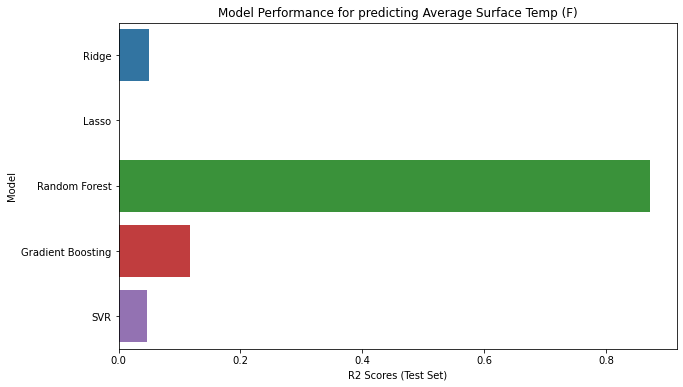

In [255]:
# Visualizing the performance of different models in predicting 'Average Surface Temp (F)'

sns.barplot(x=results_df_2['R2'], y=results_df_2['Model'])
plt.xlabel("R2 Scores (Test Set)")
plt.title('Model Performance for predicting Average Surface Temp (F)')
plt.show()


### As we can see above, Random Forest was the best model for predicting Average Surface Temperatures with an R2 of 0.87 whereas all other models failed to capture the patterns of data with unsatisfactory R2. Also, Lasso performed the worst with 0 R2, basically failing to capture any variance in the target feature by the predictor variables.

### Model Performance Discussion


Our all models performed poorly except of Random Forest which was better in understanding the patterns in training set. Followig reason may be possible:  

#### Random Forest's Superior Performance: 

Random Forest outperforms other models on the training set, showing lower errors and higher R2 values. This suggests that Random Forest is better at capturing the underlying patterns in the training data compared to Ridge, Lasso, Gradient Boosting, and SVR.

#### Possible Issues with Ridge, Lasso, and SVR: 

Ridge, Lasso, and SVR exhibit relatively high errors and low R2 values, suggesting potential challenges in capturing the underlying relationships in the data or overfitting.

#### Gradient Boosting's Middle Ground: 

Gradient Boosting performs better than Ridge, Lasso, and SVR but not as well as Random Forest. It strikes a middle ground in terms of model fit on the training set.

### Results of the Project

1) For predicting Energy Usage, Gradient Boosting Regressor was the best model.  
2) For predicting Summer Land Surface Temperatures, Random Forest Regressor was the best model.

### Assumptions of the Project

The project was based on certain assumptions. The chief assumption was that we considered energy indicators based on site and not on source (which took energy distribution and generation into account) since we were doing local analysis. We assumed that some of the outlier values which had no proper way to handle as true and genuine. Also, we assumed that sensor data had no impact on the analysis. 

### Limitations of the Project

Talking about limitations, the model does take into weather patterns of 12 months along with traffic data on the surrounding environment. In addition to that, the model was trained on limited set of hyperparameter owing to resource and time constraints. Talking about second model which was used for predicting average surface temperature during summer, our models performed badly. It may be due to the incorrect approach to data cleaning or joining. Also, it may have happened due to poor feature engineering and bad fitting of the training set by the model.

### Conclusion

However, the project has immense scope for the future. If proper feature handling and granular handling of missing values and outliers are performed then the model performance can be improved. Moreover a detailed exploratory analysis can help in uncovering subtle patterns in the temperature and energy data. In addition to that location based analysis can also help in finding new insights. This project also can help in aiding government, academia and common citizens of New York City in order to manage its energy resources, emissions and predicting Land Surface Temperatures during summer months, thereby improving the quality of life for the citizens of New York City.